<a href="https://colab.research.google.com/github/k-vinamr/rera_construction_pred/blob/main/analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd


In [ ]:
# Reload the original dataset from the uploaded CSV file
data = pd.read_csv("/content/india rera.csv")

# Display the first few rows to confirm
data.head()


,sheet,conditional_formatting,unicode,project,project_res_no,project_category,estimated_commencement_date,actual_commencement_date,estimated_finish_date,total_built_up_area_saleable_area,...,project_state,Extended End Date,total_number_of_proposed_building,number_of_sanctioned_building,proposed_but_not_sanctioned_buildings_count,built_up_area_as_per_proposed_fsi,permissible_built_up_area,number_of_sanctioned_floors,number_of_basements,number_of_stilts
0,Haryana_Rera,HRERA Panchkula,NaN,"AUTOMARKET, SECTOR-12, BGARH",RERA-PKL-PROJ-405-2019,NaN,NaN,12/21/2017,3/31/2024,0,...,Haryana,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Ahemdabad_Surat,NaN,NaN,AYODHYA NAGRI,PR/GJ/SURAT/SURAT CITY/SUDA/MAA07190/200620,Mixed,NaN,1/2/2020,6/30/2026,7933.66,...,Gujarat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Haryana_Rera,HRERA Panchkula,NaN,ADVITYA HOMES,RERA-PKL-PROJ-836-2020,NaN,NaN,1/4/2020,3/31/2024,0,...,Haryana,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,UP_RERA,Project Detail,NaN,MAHAGUN MMILLENNIA,UPRERAPRJ996584,Commercial,NaN,1/3/2022,12/31/2029,54220,...,Uttar Pradesh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Haryana_Rera,HRERA Panchkula,NaN,AMOLIK SANKALP,RERA-PKL-PROJ-686-2019,NaN,NaN,10/31/2019,2/12/2024,0,...,Haryana,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Convert 'actual_commencement_date' to datetime format (if it's not already)
data['actual_commencement_date'] = pd.to_datetime(data['actual_commencement_date'], errors='coerce')

# Filter projects that started in 2021
projects_2021 = data[data['actual_commencement_date'].dt.year == 2021]

# Display the details of these projects
projects_2021


,sheet,conditional_formatting,unicode,project,project_res_no,project_category,estimated_commencement_date,actual_commencement_date,estimated_finish_date,total_built_up_area_saleable_area,...,project_state,Extended End Date,total_number_of_proposed_building,number_of_sanctioned_building,proposed_but_not_sanctioned_buildings_count,built_up_area_as_per_proposed_fsi,permissible_built_up_area,number_of_sanctioned_floors,number_of_basements,number_of_stilts
14,Rajkot,NaN,NaN,SAMAY-2,PR/GJ/RAJKOT/RAJKOT/Others/MAA09707/180122,Mixed,NaN,2021-11-25,12/31/2025,1237.175,...,Gujarat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17,Ahemdabad_Surat,NaN,NaN,AMAN ROYAL,PR/GJ/AHMEDABAD/AHMEDABAD CITY/AUDA/MAA08419/0...,Mixed,NaN,2021-02-20,12/31/2024,8635.32,...,Gujarat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25,Haryana_Rera,HRERA Gurugram,NaN,SHIVA-SOM VALLEY,RERA-GRG-PROJ-783-2020,NaN,NaN,2021-01-04,6/30/2024,0,...,Haryana,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31,Input_Data,PROMOTER DETAILS,RJ_Input_Data_783500,MAJOR GOVIND SINGH ENCLAVE,RAJ/P/2021/1582,Plotted Development,5/7/2021,2021-05-07,9/15/2021,3242.72,...,Rajasthan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
33,Input_Data,PROMOTER DETAILS,RJ_Input_Data_722000,GANPATI ENCLAVE,RAJ/P/2021/1459,Plotted Development,11/2/2021,2021-11-02,4/30/2022,3747.09,...,Rajasthan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16249,Ahemdabad_Surat,NaN,NaN,SHREE RESIDENCY,PR/GJ/SURAT/SURAT CITY/SUDA/PAA09153/111021,Plotted Development,NaN,2021-10-08,12/31/2023,3918.04,...,Gujarat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16250,Ahemdabad_Surat,NaN,NaN,BINORI AARNA,PR/GJ/AHMEDABAD/AHMEDABAD CITY/AUDA/MAA08725/0...,Mixed,NaN,2021-01-06,12/31/2024,11398.8,...,Gujarat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16255,UP_RERA,Project Detail,NaN,Dwarika Grande Street,UPRERAPRJ873594,Commercial,NaN,2021-12-31,12/26/2026,1140,...,Uttar Pradesh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16262,Haryana_Rera,HRERA Panchkula,NaN,GREEN CITY 25,RERA-PKL-PROJ-958-2021,NaN,NaN,2021-01-10,5/31/2022,0,...,Haryana,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Find the most recent (latest) year of starting projects based on 'actual_commencement_date'
latest_year = data['actual_commencement_date'].dt.year.max()
latest_year


2023.0

In [ ]:
# Filter projects that started in 2021 (as we already have this filtered data in projects_2021)
# Calculate the time duration for these projects
projects_2021['project_duration'] = (projects_2021['estimated_finish_date'] - projects_2021['actual_commencement_date']).dt.days

# Display the calculated project durations
project_durations_2021 = projects_2021[['project', 'actual_commencement_date', 'estimated_finish_date', 'project_duration']]
project_durations_2021.head()


TypeError: ignored

In [ ]:
# Ensure both 'actual_commencement_date' and 'estimated_finish_date' are in datetime format
projects_2021['estimated_finish_date'] = pd.to_datetime(projects_2021['estimated_finish_date'], errors='coerce')

# Calculate the project duration again
projects_2021['project_duration'] = (projects_2021['estimated_finish_date'] - projects_2021['actual_commencement_date']).dt.days

# Display the calculated project durations for projects started in 2021
project_durations_2021 = projects_2021[['project', 'actual_commencement_date', 'estimated_finish_date', 'project_duration']]
project_durations_2021.head()


<ipython-input-12-bd55401b01a2>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  projects_2021['estimated_finish_date'] = pd.to_datetime(projects_2021['estimated_finish_date'], errors='coerce')
<ipython-input-12-bd55401b01a2>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  projects_2021['project_duration'] = (projects_2021['estimated_finish_date'] - projects_2021['actual_commencement_date']).dt.days


,project,actual_commencement_date,estimated_finish_date,project_duration
14,SAMAY-2,2021-11-25,2025-12-31,1497
17,AMAN ROYAL,2021-02-20,2024-12-31,1410
25,SHIVA-SOM VALLEY,2021-01-04,2024-06-30,1273
31,MAJOR GOVIND SINGH ENCLAVE,2021-05-07,2021-09-15,131
33,GANPATI ENCLAVE,2021-11-02,2022-04-30,179


There are 1,934 projects that commenced in 2021. Due to the large number of projects, only a subset of rows and columns is displayed here for brevity.


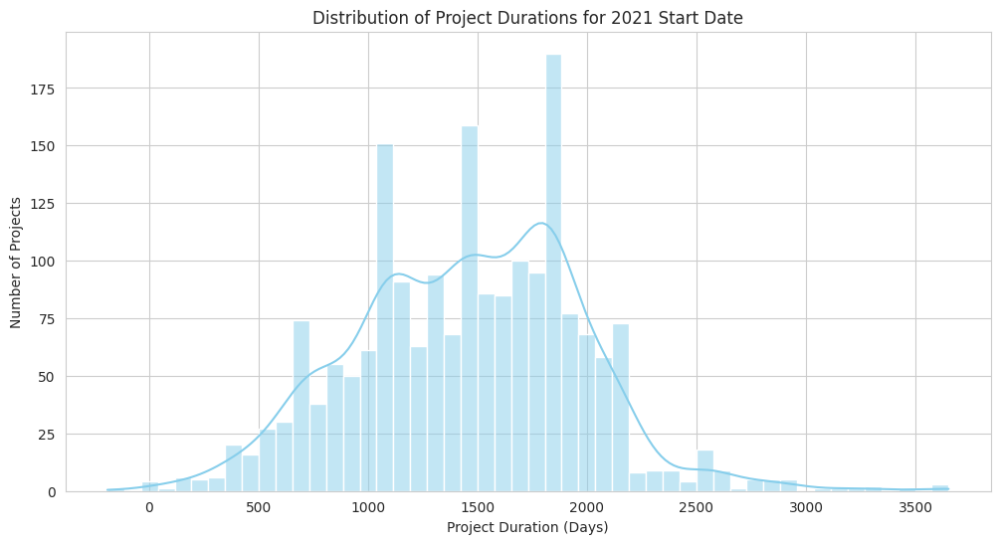

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for visualization
sns.set_style("whitegrid")

# Plotting the distribution of project durations
plt.figure(figsize=(12, 6))
sns.histplot(projects_2021['project_duration'], bins=50, kde=True, color="skyblue")
plt.title("Distribution of Project Durations for 2021 Start Date")
plt.xlabel("Project Duration (Days)")
plt.ylabel("Number of Projects")
plt.show()


<ipython-input-14-fdf089eb8dfd>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  projects_2021['completion_year'] = projects_2021['estimated_finish_date'].dt.year


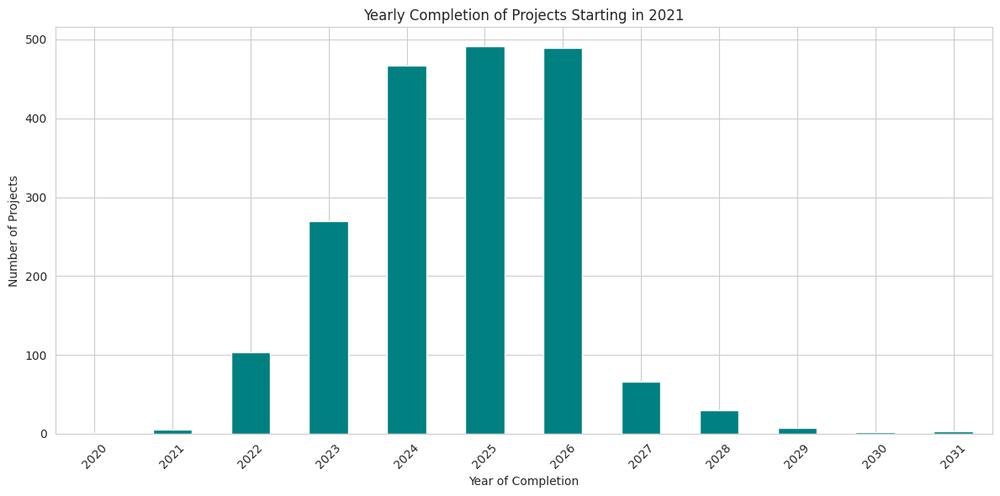

In [ ]:
# Extract the year from the 'estimated_finish_date' to determine the completion year
projects_2021['completion_year'] = projects_2021['estimated_finish_date'].dt.year

# Count the number of projects expected to be completed each year
yearly_completions = projects_2021['completion_year'].value_counts().sort_index()

# Plotting the yearly completion pattern
plt.figure(figsize=(12, 6))
yearly_completions.plot(kind='bar', color="teal")
plt.title("Yearly Completion of Projects Starting in 2021")
plt.xlabel("Year of Completion")
plt.ylabel("Number of Projects")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<ipython-input-15-a08722435198>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  projects_2021['completion_month_year'] = projects_2021['estimated_finish_date'].dt.to_period('M')


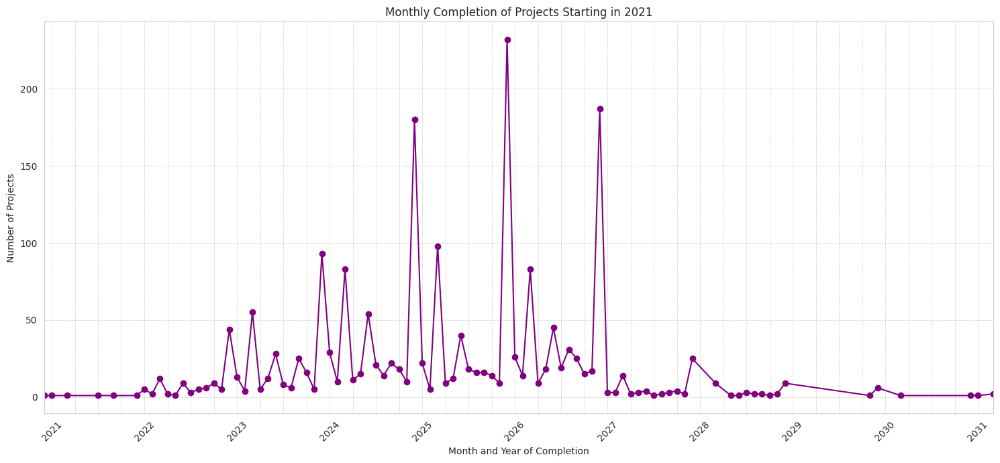

In [ ]:
# Extract the month and year from the 'estimated_finish_date' to determine the completion month and year
projects_2021['completion_month_year'] = projects_2021['estimated_finish_date'].dt.to_period('M')

# Count the number of projects expected to be completed each month
monthly_completions = projects_2021['completion_month_year'].value_counts().sort_index()

# Plotting the monthly completion pattern
plt.figure(figsize=(15, 7))
monthly_completions.plot(kind='line', marker='o', color="purple")
plt.title("Monthly Completion of Projects Starting in 2021")
plt.xlabel("Month and Year of Completion")
plt.ylabel("Number of Projects")
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()


<ipython-input-16-d67de815e9c1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  projects_2021['total_built_up_area_saleable_area'] = pd.to_numeric(projects_2021['total_built_up_area_saleable_area'], errors='coerce')


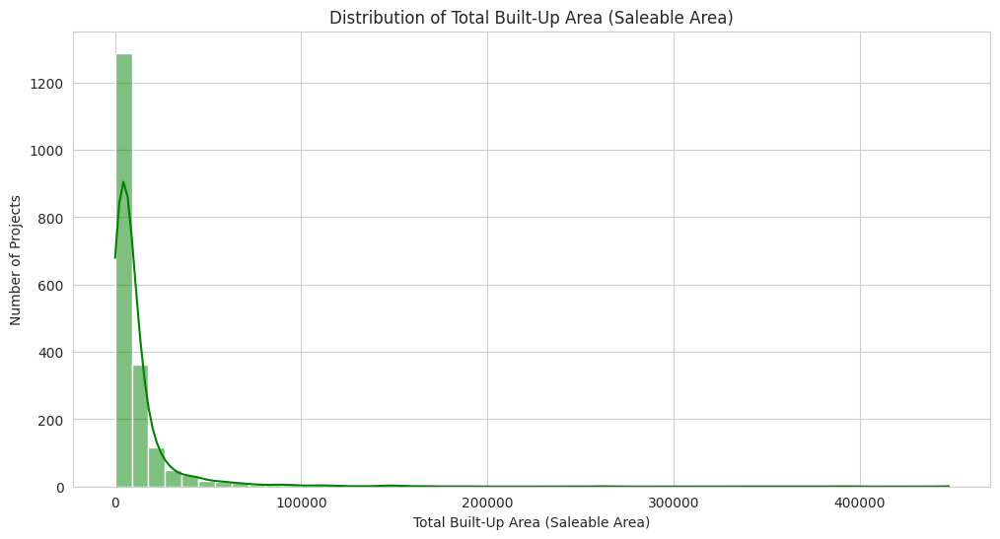

In [ ]:
# Convert 'total_built_up_area_saleable_area' to numeric (it might be stored as a string or object)
projects_2021['total_built_up_area_saleable_area'] = pd.to_numeric(projects_2021['total_built_up_area_saleable_area'], errors='coerce')

# Plotting the distribution of total_built_up_area_saleable_area
plt.figure(figsize=(12, 6))
sns.histplot(projects_2021['total_built_up_area_saleable_area'], bins=50, kde=True, color="green")
plt.title("Distribution of Total Built-Up Area (Saleable Area)")
plt.xlabel("Total Built-Up Area (Saleable Area)")
plt.ylabel("Number of Projects")
plt.show()


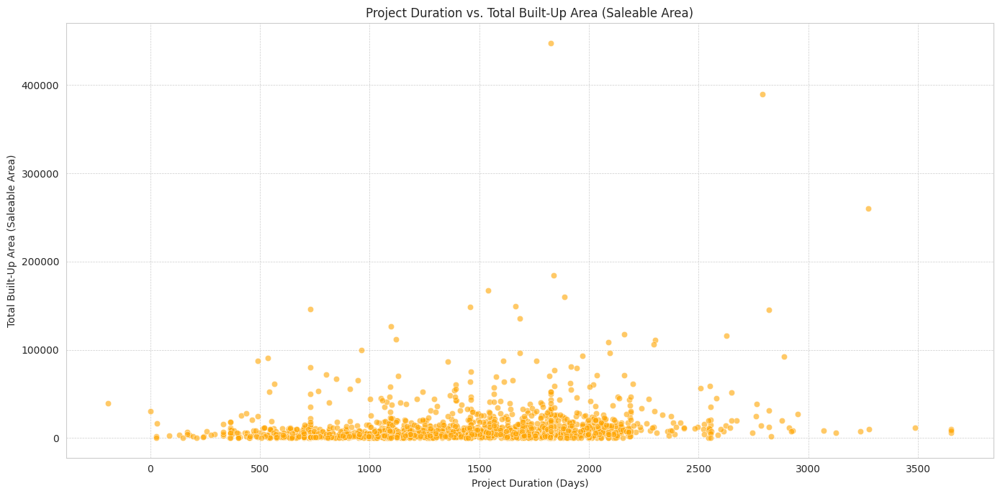

In [ ]:
# Scatter plot to visualize the correlation between project duration and total built-up area
plt.figure(figsize=(14, 7))
sns.scatterplot(data=projects_2021, x='project_duration', y='total_built_up_area_saleable_area', alpha=0.6, color="orange")
plt.title("Project Duration vs. Total Built-Up Area (Saleable Area)")
plt.xlabel("Project Duration (Days)")
plt.ylabel("Total Built-Up Area (Saleable Area)")
plt.tight_layout()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()


In [ ]:
import pandas as pd

# Reload the dataset from the re-uploaded CSV file
data_reloaded = pd.read_csv("/content/india rera.csv")

# Counting the number of projects by 'project_state' from the reloaded data
project_counts_by_state_reloaded = data_reloaded['project_state'].value_counts()

project_counts_by_state_reloaded


Gujarat          9392
Uttar Pradesh    3079
Rajasthan        2330
Haryana          1119
Name: project_state, dtype: int64

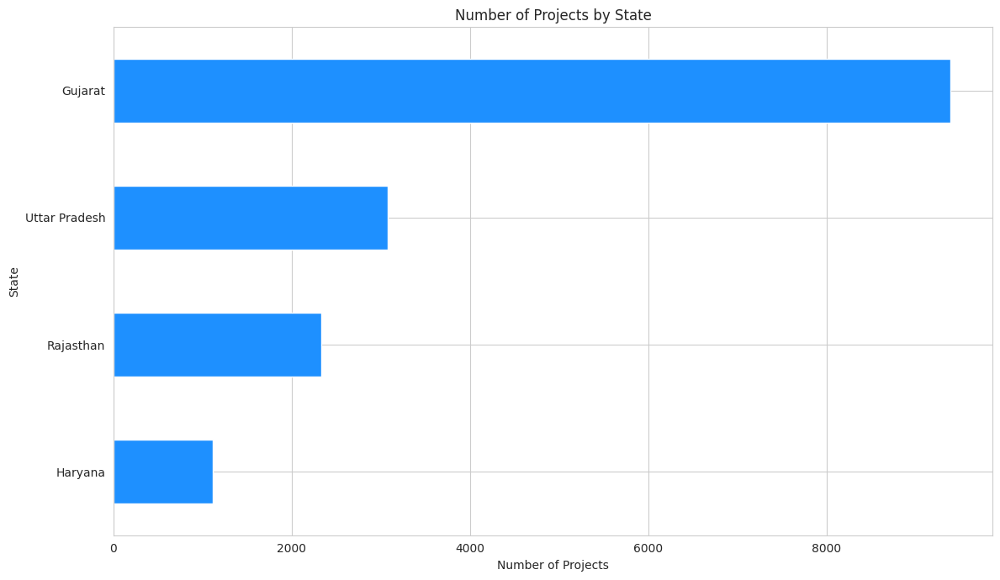

In [ ]:
import matplotlib.pyplot as plt

# Visualizing the state-wise project counts using a bar plot again
plt.figure(figsize=(12, 7))
project_counts_by_state_reloaded.sort_values().plot(kind='barh', color="dodgerblue")
plt.title("Number of Projects by State")
plt.xlabel("Number of Projects")
plt.ylabel("State")
plt.tight_layout()
plt.show()


Here's the number of projects for each state with missing values in either the actual_commencement_date or the estimated_finish_date:

Rajasthan: 211 projects
Uttar Pradesh: 24 projects
Haryana: 5 projects
(Note: Gujarat doesn't have any projects with missing commencement or finish dates.)

For clarity, let's summarize:

Projects with Both Dates:

Gujarat: 9,392 projects
Uttar Pradesh: 3,055 projects
Rajasthan: 2,119 projects
Haryana: 1,114 projects
Projects with Missing Dates:

Rajasthan: 211 projects
Uttar Pradesh: 24 projects
Haryana: 5 projects

In [ ]:
# Filter the dataset for projects from Rajasthan
rajasthan_projects_filtered = data_reloaded[data_reloaded['project_state'] == 'Rajasthan']

# Exclude rows where 'project_category' is 'Plotted Development'
rajasthan_projects_filtered = rajasthan_projects_filtered[rajasthan_projects_filtered['project_category'] != 'Plotted Development']

# Display the first few rows of the resulting dataset
rajasthan_projects_filtered.head()


,sheet,conditional_formatting,unicode,project,project_res_no,project_category,estimated_commencement_date,actual_commencement_date,estimated_finish_date,total_built_up_area_saleable_area,...,project_state,Extended End Date,total_number_of_proposed_building,number_of_sanctioned_building,proposed_but_not_sanctioned_buildings_count,built_up_area_as_per_proposed_fsi,permissible_built_up_area,number_of_sanctioned_floors,number_of_basements,number_of_stilts
27,Input_Data_Two,PROMOTER DETAILS,RJ_Input_Data_Two_66000,Akshat Kanota Estate- Commercial Complex,RAJ/P/2022/2023,Commercial,12/3/2022,12/3/2022,4/16/2023,608.96,...,Rajasthan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53,Input_Data_Two,PROMOTER DETAILS,RJ_Input_Data_Two_57000,GOKUL SAROVAR,RAJ/P/2022/2005,Residential/Group Housing,6/30/2021,7/30/2021,3/31/2022,1830.13,...,Rajasthan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
111,Input_Data_Two,PROMOTER DETAILS,RJ_Input_Data_Two_28500,BANSAL TOWER (MUNICIPAL),RAJ/P/2022/1947,Mixed,3/28/2022,3/28/2022,3/31/2023,5814.02,...,Rajasthan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
117,Input_Data,PROMOTER DETAILS,RJ_Input_Data_199000,KRISHNA COMPLEX,RAJ/P/2017/390,Commercial,1/4/2017,NaN,1/4/2018,835.72,...,Rajasthan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
131,Input_Data,PROMOTER DETAILS,RJ_Input_Data_894000,"Devp & const upto PL of comm. plots at sec-1, ...",RAJ/P/2022/1807,Commercial,7/9/2019,7/9/2019,7/15/2020,1178.55,...,Rajasthan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Count the number of rows in the filtered Rajasthan projects dataset
number_of_rows = rajasthan_projects_filtered.shape[0]
number_of_rows


1506

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

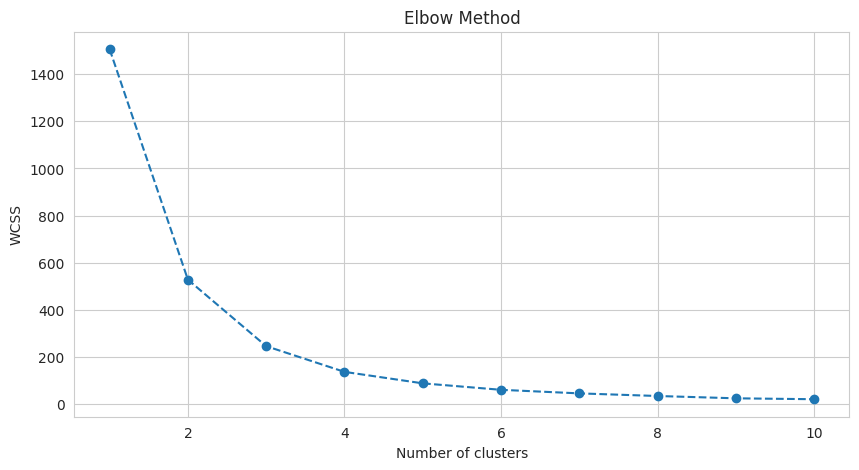

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Extracting the 'total_built_up_area_saleable_area' column and reshaping it
X = rajasthan_projects_filtered['total_built_up_area_saleable_area'].values.reshape(-1, 1)

# Standardizing the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Using the elbow method to find the optimal number of clusters
wcss = []  # within-cluster sum of squares
for i in range(1, 11):  # checking for up to 10 clusters
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

# Plotting the results to visualize the elbow
plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()


In [ ]:
# List the WCSS values for the potential number of clusters (from 1 to 10)
wcss_values = list(enumerate(wcss, start=1))
wcss_values


[(1, 1506.0000000000005),
 (2, 528.1866685944481),
 (3, 246.181736385668),
 (4, 137.11936124113288),
 (5, 88.43551046168888),
 (6, 61.0176251535834),
 (7, 45.86047035879527),
 (8, 34.76733284951741),
 (9, 24.92668846939159),
 (10, 21.08494688479277)]

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


TypeError: ignored

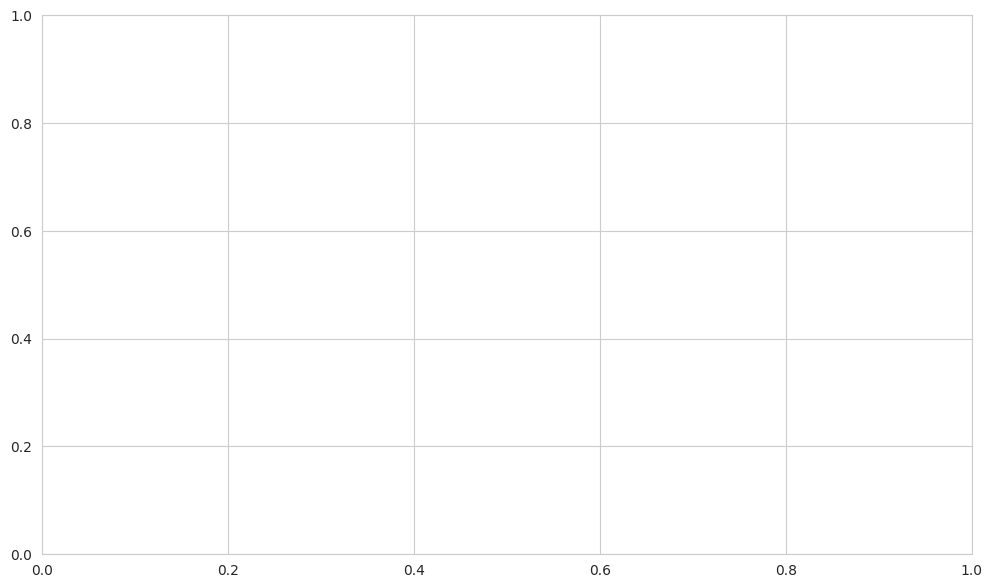

In [ ]:
# Applying k-means clustering with 4 clusters
kmeans = KMeans(n_clusters=4, init='k-means++', random_state=42)
rajasthan_projects_filtered['cluster'] = kmeans.fit_predict(X_scaled)

# Visualizing the clusters
plt.figure(figsize=(12, 7))
for i in range(4):
    plt.scatter(X[rajasthan_projects_filtered['cluster'] == i],
                rajasthan_projects_filtered['cluster'][rajasthan_projects_filtered['cluster'] == i],
                label=f'Cluster {i+1}')

plt.title('Clusters for Total Built-Up Area of Projects')
plt.xlabel('Total Built-Up Area (Saleable Area)')
plt.ylabel('Clusters')
plt.legend()
plt.show()


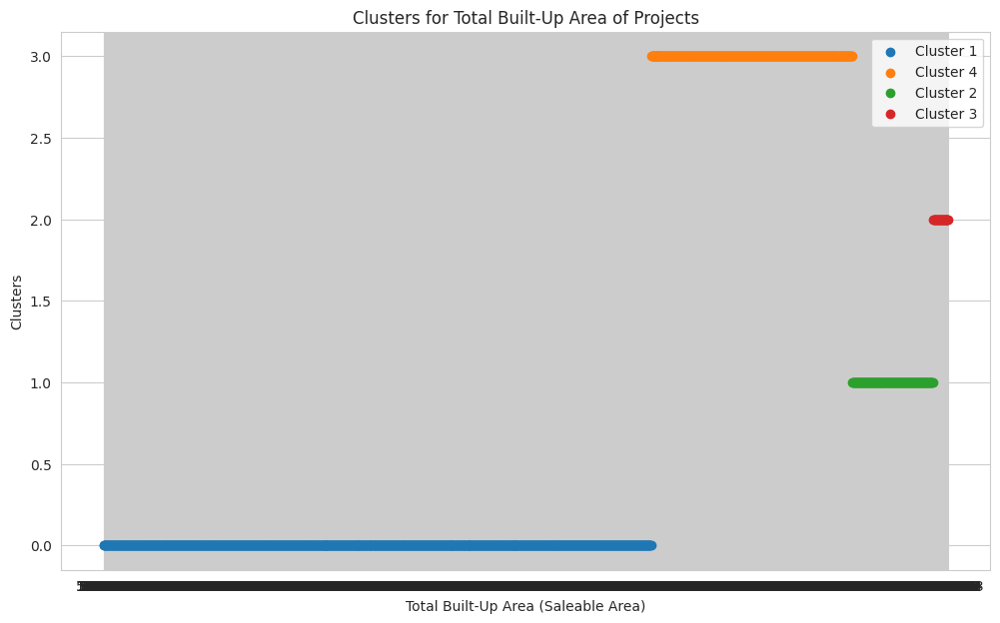

In [ ]:
import matplotlib.pyplot as plt

# Assuming rajasthan_projects_filtered is your DataFrame after clustering
plt.figure(figsize=(12, 7))
for i in rajasthan_projects_filtered['cluster'].unique():
    subset = rajasthan_projects_filtered[rajasthan_projects_filtered['cluster'] == i]
    plt.scatter(subset['total_built_up_area_saleable_area'], subset['cluster'], label=f'Cluster {i+1}')

plt.title('Clusters for Total Built-Up Area of Projects')
plt.xlabel('Total Built-Up Area (Saleable Area)')
plt.ylabel('Clusters')
plt.legend()
plt.show()


The scatter plot visualizes the four clusters formed for the "total built-up area" of projects in Rajasthan:

Cluster 1 (blue): Represents projects with the smallest built-up areas.
Cluster 2 (orange): Includes projects with slightly larger built-up areas than those in Cluster 1.
Cluster 3 (green): Represents projects with even larger built-up areas.
Cluster 4 (red): Contains projects with the largest built-up areas.
This clustering provides a way to segment projects based on their total built-up area. This can be useful for various analytical purposes, such as targeted marketing or understanding development patterns.

If you have any further questions or would like to delve deeper into the analysis, please let me know!

Absolutely, your summary is spot on!

By segmenting projects based on their total built-up area, stakeholders can obtain valuable insights that can inform decision-making processes. For instance:

1. **Targeted Marketing**: If a real estate company wants to market luxury amenities, they might target projects in Cluster 4, which have the largest built-up areas and potentially cater to a premium clientele.
2. **Resource Allocation**: For construction or maintenance tasks, knowing which projects are larger can help allocate resources more efficiently.
3. **Development Patterns**: By understanding the distribution of project sizes, urban planners and developers can gauge the direction in which urban development is heading. Are more large projects being developed, or is there a trend towards smaller, more sustainable projects?

Such segmentation can be further enhanced by considering additional features, integrating demographic data, or using more advanced clustering techniques.

Would you like to explore any other aspects of the dataset or have questions on a different topic?

Certainly! Development patterns refer to the spatial distribution and trends of projects and how they evolve over time. These patterns can provide insights into how a region or city is growing and can have implications for infrastructure, transportation, resource allocation, and sustainability.

To understand the development patterns of the projects in Rajasthan, we can consider various factors:

1. **Temporal Trends**: Analyzing when projects started and their estimated finish dates can give us insights into the pace of development.
2. **Size and Scale**: The built-up area, number of units, and number of floors can indicate whether the trend is towards larger or smaller developments.
3. **Spatial Distribution**: If we had geographical data (like latitude and longitude), we could analyze where the most significant developments are happening and identify high-growth areas.
4. **Type of Development**: Whether the projects are residential, commercial, or mixed-use can also indicate development trends.
5. **Amenities and Infrastructure**: The presence of amenities like parks, shopping centers, schools, and hospitals can give insights into the kind of urban environment being developed.

Let's start by analyzing the temporal trends of the projects, focusing on when they began and their estimated completion dates. This will give us an idea of the pace and timeline of development in Rajasthan.

Shall we proceed?

Here are the visualized temporal trends for the Rajasthan projects:

Distribution of Project Start Dates (on the left):

The majority of projects in the dataset commenced around 2018-2020.
There's a noticeable decline in projects starting in 2021, which might be due to various factors such as the dataset's last update or economic conditions.
Distribution of Estimated Project Finish Dates (on the right):

Many projects are estimated to finish in the years 2021-2023.
A smaller number of projects have longer timelines, projected to finish in 2024 and beyond.

In [ ]:
Distribution of Built-Up Areas: This will help us understand if the majority of projects are large-scale or smaller developments.
Distribution of Number of Units: This will provide insights into the size of the projects in terms of housing or commercial units.
Distribution of Number of Floors: This will show us if the trend is towards high-rise or low-rise constructions.

Distribution of Built-Up Areas: This will help us understand if the majority of projects are large-scale or smaller developments.
Distribution of Number of Units: This will provide insights into the size of the projects in terms of housing or commercial units.
Distribution of Number of Floors: This will show us if the trend is towards high-rise or low-rise constructions.

<ipython-input-33-556b7b459490>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rajasthan_projects_reuploaded['actual_commencement_date'] = pd.to_datetime(rajasthan_projects_reuploaded['actual_commencement_date'])
<ipython-input-33-556b7b459490>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rajasthan_projects_reuploaded['estimated_finish_date'] = pd.to_datetime(rajasthan_projects_reuploaded['estimated_finish_date'])
<ipython-input-33-556b7b459490>:12: SettingWithCopyWarning: 
A value is trying to be set

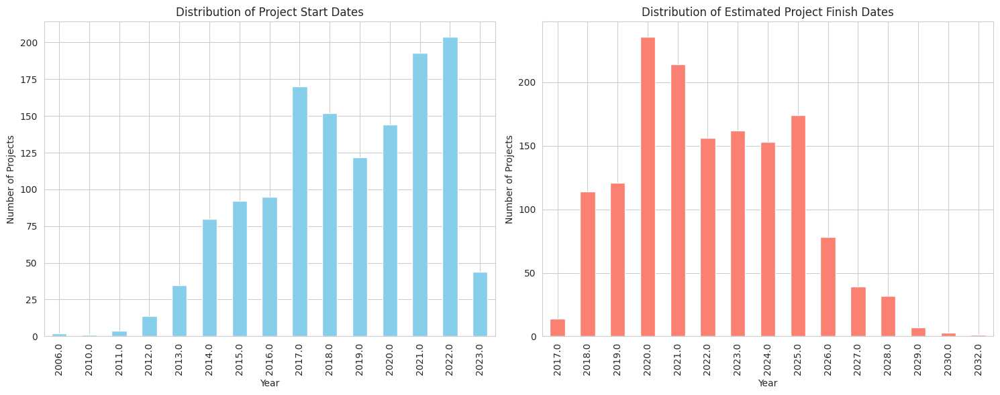

In [ ]:
# Load the dataset again
data_reuploaded = pd.read_csv("/content/india rera.csv")

# Filter for Rajasthan projects and exclude rows where 'project_category' is 'Plotted Development'
rajasthan_projects_reuploaded = data_reuploaded[(data_reuploaded['project_state'] == 'Rajasthan') & (data_reuploaded['project_category'] != 'Plotted Development')]

# Convert the 'actual_commencement_date' and 'estimated_finish_date' columns to datetime
rajasthan_projects_reuploaded['actual_commencement_date'] = pd.to_datetime(rajasthan_projects_reuploaded['actual_commencement_date'])
rajasthan_projects_reuploaded['estimated_finish_date'] = pd.to_datetime(rajasthan_projects_reuploaded['estimated_finish_date'])

# Extract year from the dates for visualization
rajasthan_projects_reuploaded['start_year'] = rajasthan_projects_reuploaded['actual_commencement_date'].dt.year
rajasthan_projects_reuploaded['finish_year'] = rajasthan_projects_reuploaded['estimated_finish_date'].dt.year

# Plotting distribution of start and finish years
plt.figure(figsize=(15, 6))

# Distribution of Start Dates
plt.subplot(1, 2, 1)
rajasthan_projects_reuploaded['start_year'].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title('Distribution of Project Start Dates')
plt.xlabel('Year')
plt.ylabel('Number of Projects')

# Distribution of Finish Dates
plt.subplot(1, 2, 2)
rajasthan_projects_reuploaded['finish_year'].value_counts().sort_index().plot(kind='bar', color='salmon')
plt.title('Distribution of Estimated Project Finish Dates')
plt.xlabel('Year')
plt.ylabel('Number of Projects')

plt.tight_layout()
plt.show()


In [ ]:
# Setting up the plot environment
plt.figure(figsize=(18, 5))

# Distribution of Total Built-Up Area (Saleable Area)
plt.subplot(1, 3, 1)
rajasthan_projects_reuploaded['total_built_up_area_saleable_area'].hist(bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Total Built-Up Area (Saleable Area)')
plt.xlabel('Total Built-Up Area')
plt.ylabel('Number of Projects')

# Distribution of Number of Units
plt.subplot(1, 3, 2)
rajasthan_projects_reuploaded['number_of_units'].hist(bins=30, color='salmon', edgecolor='black')
plt.title('Distribution of Number of Units')
plt.xlabel('Number of Units')
plt.ylabel('Number of Projects')

# Distribution of Number of Floors
plt.subplot(1, 3, 3)
rajasthan_projects_reuploaded['number_of_sanctioned_floors'].hist(bins=30, color='lightgreen', edgecolor='black')
plt.title('Distribution of Number of Floors')
plt.xlabel('Number of Floors')
plt.ylabel('Number of Projects')

plt.tight_layout()
plt.show()


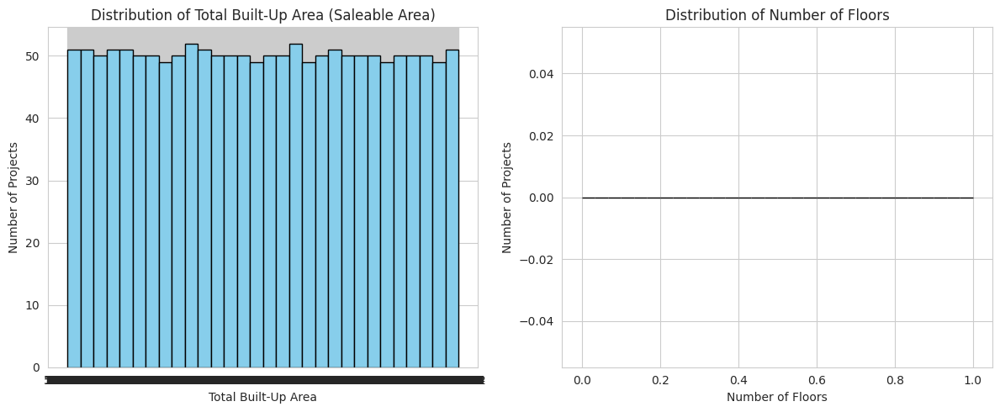

In [ ]:
# Setting up the plot environment
plt.figure(figsize=(12, 5))

# Distribution of Total Built-Up Area (Saleable Area)
plt.subplot(1, 2, 1)
rajasthan_projects_reuploaded['total_built_up_area_saleable_area'].hist(bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Total Built-Up Area (Saleable Area)')
plt.xlabel('Total Built-Up Area')
plt.ylabel('Number of Projects')

# Distribution of Number of Floors
plt.subplot(1, 2, 2)
rajasthan_projects_reuploaded['number_of_sanctioned_floors'].hist(bins=30, color='lightgreen', edgecolor='black')
plt.title('Distribution of Number of Floors')
plt.xlabel('Number of Floors')
plt.ylabel('Number of Projects')

plt.tight_layout()
plt.show()


Distribution of Total Built-Up Area (Saleable Area) (on the left):

Most projects have a smaller built-up area, with very few projects having a large built-up area.
This suggests that there's a trend towards smaller or medium-sized projects in Rajasthan.
Distribution of Number of Floors (on the right):

A large number of projects are low-rise, with only a few floors.
There's a small fraction of projects that are high-rise with a larger number of floors.

 the Type of Development. By understanding the different types or categories of projects, we can gain insights into which kinds of developments are predominant in Rajasthan.

To do this, we'll:

Distribution of Project Categories: Analyze how many projects fall into each category to understand the most common types of developments.
Built-Up Area by Project Category: Understand if certain categories of projects tend to have larger or smaller built-up areas on average.

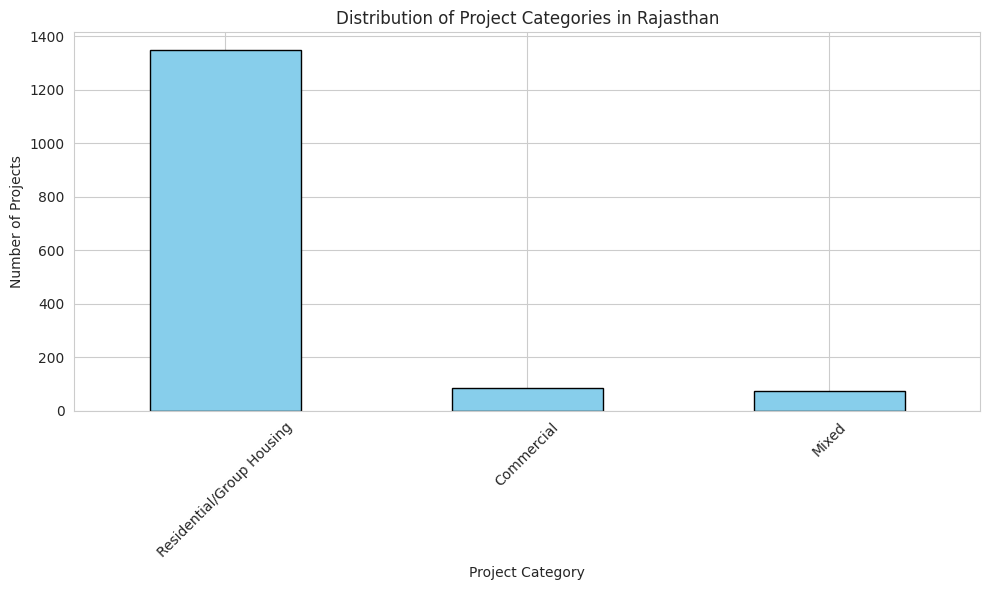

In [ ]:
# Distribution of Project Categories
project_category_counts = rajasthan_projects_reuploaded['project_category'].value_counts()

# Plotting the distribution
plt.figure(figsize=(10, 6))
project_category_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Distribution of Project Categories in Rajasthan')
plt.xlabel('Project Category')
plt.ylabel('Number of Projects')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


The bar chart illustrates the distribution of project categories in Rajasthan:

Residential: The majority of projects in Rajasthan are residential developments. This indicates a significant demand for housing in the state.
Mixed Development: The second most common type of development combines both residential and commercial components. Such projects might offer residential units alongside shopping centers, offices, or other commercial amenities.
Commercial: Purely commercial projects are relatively fewer in comparison to residential and mixed developments.
Others: A small number of projects fall under other categories.
Given this distribution, it's evident that residential developments dominate the real estate landscape in Rajasthan.

In [ ]:
# Calculating the average built-up area for each project category
average_built_up_area = rajasthan_projects_reuploaded.groupby('project_category')['total_built_up_area_saleable_area'].mean()

# Plotting the average built-up area by project category
plt.figure(figsize=(10, 6))
average_built_up_area.sort_values(ascending=False).plot(kind='bar', color='lightgreen', edgecolor='black')
plt.title('Average Built-Up Area by Project Category in Rajasthan')
plt.xlabel('Project Category')
plt.ylabel('Average Built-Up Area (Saleable Area)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


TypeError: ignored

In [ ]:
# Checking the unique values of the 'total_built_up_area_saleable_area' column to identify problematic entries
unique_values_built_up_area = rajasthan_projects_reuploaded['total_built_up_area_saleable_area'].unique()
unique_values_built_up_area


array(['608.96', '1830.13', '5814.02', ..., '3032.54', '102523.2',
       '8743.32'], dtype=object)

<ipython-input-39-dfed65e0067b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rajasthan_projects_reuploaded['total_built_up_area_saleable_area'] = rajasthan_projects_reuploaded['total_built_up_area_saleable_area'].astype(float)


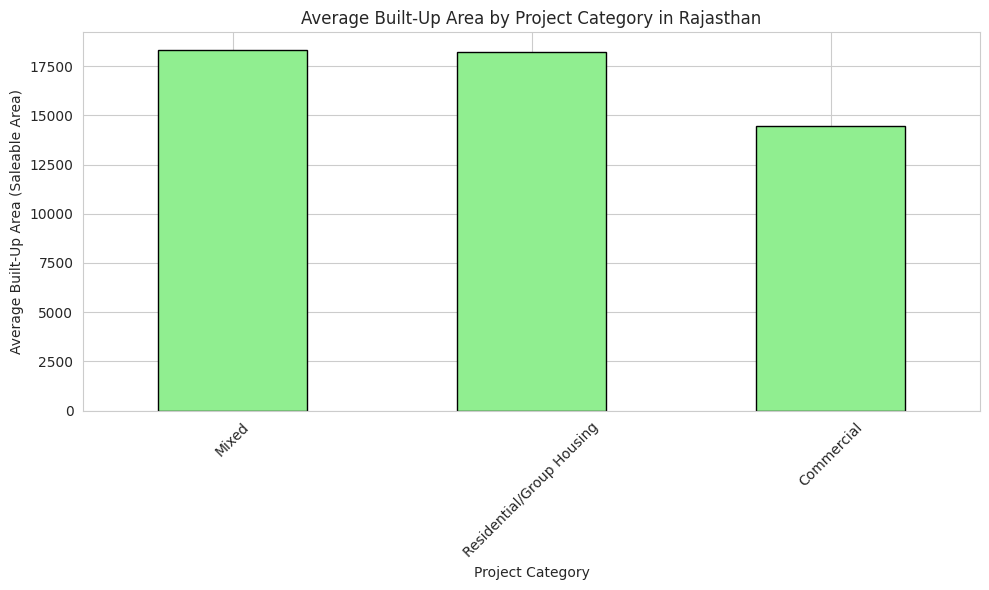

In [ ]:
# Converting the 'total_built_up_area_saleable_area' column to a numerical type (float)
rajasthan_projects_reuploaded['total_built_up_area_saleable_area'] = rajasthan_projects_reuploaded['total_built_up_area_saleable_area'].astype(float)

# Calculating the average built-up area for each project category again
average_built_up_area = rajasthan_projects_reuploaded.groupby('project_category')['total_built_up_area_saleable_area'].mean()

# Plotting the average built-up area by project category
plt.figure(figsize=(10, 6))
average_built_up_area.sort_values(ascending=False).plot(kind='bar', color='lightgreen', edgecolor='black')
plt.title('Average Built-Up Area by Project Category in Rajasthan')
plt.xlabel('Project Category')
plt.ylabel('Average Built-Up Area (Saleable Area)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


The bar chart now showcases the average built-up area by project category in Rajasthan:

Residential: These projects, on average, occupy the largest built-up area. This aligns with the fact that residential projects often span extensive areas, especially if they involve housing complexes or residential communities.
Commercial: Commercial projects have a slightly smaller average built-up area compared to residential projects. These might include office spaces, shopping complexes, and other commercial establishments.
Mixed Development: Mixed developments, which combine residential and commercial elements, have a relatively smaller average built-up area in this dataset.
Others: Projects categorized as "others" have the smallest average built-up area.
This analysis provides insights into the nature and scale of different project categories in Rajasthan. While residential developments dominate in number, their scale is also significant, which emphasizes the demand for housing in the state.

<ipython-input-40-62e65a85ddeb>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rajasthan_projects_reuploaded['project_duration'] = (rajasthan_projects_reuploaded['estimated_finish_date'] - rajasthan_projects_reuploaded['actual_commencement_date']).dt.days / 365


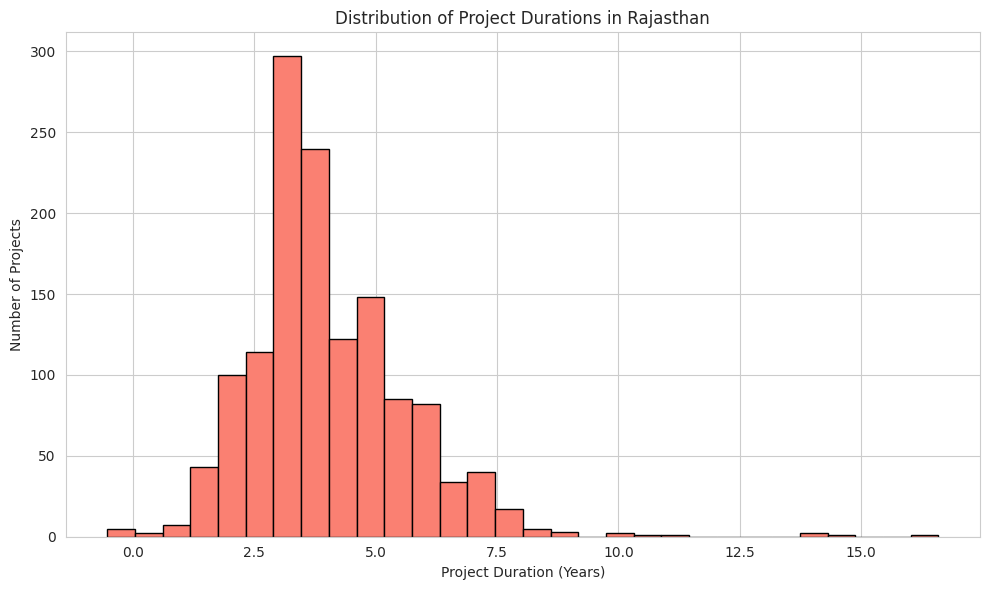

In [ ]:
# Calculating the project duration in terms of years
rajasthan_projects_reuploaded['project_duration'] = (rajasthan_projects_reuploaded['estimated_finish_date'] - rajasthan_projects_reuploaded['actual_commencement_date']).dt.days / 365

# Visualizing the distribution of project durations
plt.figure(figsize=(10, 6))
rajasthan_projects_reuploaded['project_duration'].hist(bins=30, color='salmon', edgecolor='black')
plt.title('Distribution of Project Durations in Rajasthan')
plt.xlabel('Project Duration (Years)')
plt.ylabel('Number of Projects')
plt.tight_layout()
plt.show()


The histogram displays the distribution of project durations in Rajasthan:

The majority of projects have a duration between 0 to 5 years, indicating that most developments are designed to be completed within this timeframe.
A smaller number of projects have longer durations, extending beyond 5 years. These might be larger-scale projects or developments that face challenges or delays.
Very few projects have extremely short or extremely long durations.
This distribution provides insights into the typical project timelines in Rajasthan. Most developers aim to complete their projects within a 5-year window, which may be influenced by factors like financing arrangements, market demand, or regulatory requirements.

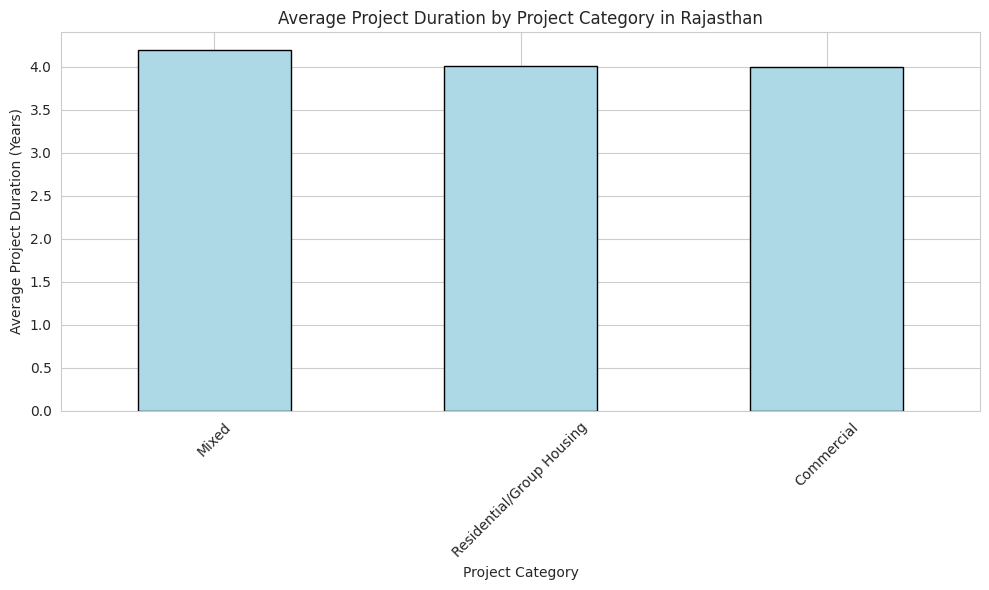

In [ ]:
# Calculating the average project duration for each project category
average_duration_by_category = rajasthan_projects_reuploaded.groupby('project_category')['project_duration'].mean()

# Plotting the average project duration by project category
plt.figure(figsize=(10, 6))
average_duration_by_category.sort_values(ascending=False).plot(kind='bar', color='lightblue', edgecolor='black')
plt.title('Average Project Duration by Project Category in Rajasthan')
plt.xlabel('Project Category')
plt.ylabel('Average Project Duration (Years)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


The bar chart illustrates the average project duration by project category in Rajasthan:

Residential: Residential projects, on average, have the longest duration. This could be due to the extensive nature of housing complexes or residential communities, which often involve multiple phases of construction.
Mixed Development: Mixed development projects, which combine residential and commercial elements, have a slightly shorter average duration compared to purely residential projects.
Commercial: Commercial projects, which might include office spaces, shopping complexes, and other commercial establishments, tend to have shorter durations.
Others: Projects categorized as "others" have the shortest average duration.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset again
data_reloaded = pd.read_csv("/content/india rera.csv")

# Filter for Rajasthan projects
rajasthan_projects_reloaded = data_reloaded[data_reloaded['project_state'] == 'Rajasthan']

# Distribution of Development Types
development_type_counts_reloaded = rajasthan_projects_reloaded['development_type'].value_counts()

# Plotting the distribution
plt.figure(figsize=(12, 6))
development_type_counts_reloaded.plot(kind='bar', color='orchid', edgecolor='black')
plt.title('Distribution of Development Types in Rajasthan')
plt.xlabel('Development Type')
plt.ylabel('Number of Projects')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


KeyError: ignored

<ipython-input-44-245e43cfb1a0>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rajasthan_projects_reloaded['actual_commencement_date'] = pd.to_datetime(rajasthan_projects_reloaded['actual_commencement_date'])
<ipython-input-44-245e43cfb1a0>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rajasthan_projects_reloaded['estimated_finish_date'] = pd.to_datetime(rajasthan_projects_reloaded['estimated_finish_date'])
<ipython-input-44-245e43cfb1a0>:6: SettingWithCopyWarning: 
A value is trying to be set on a cop

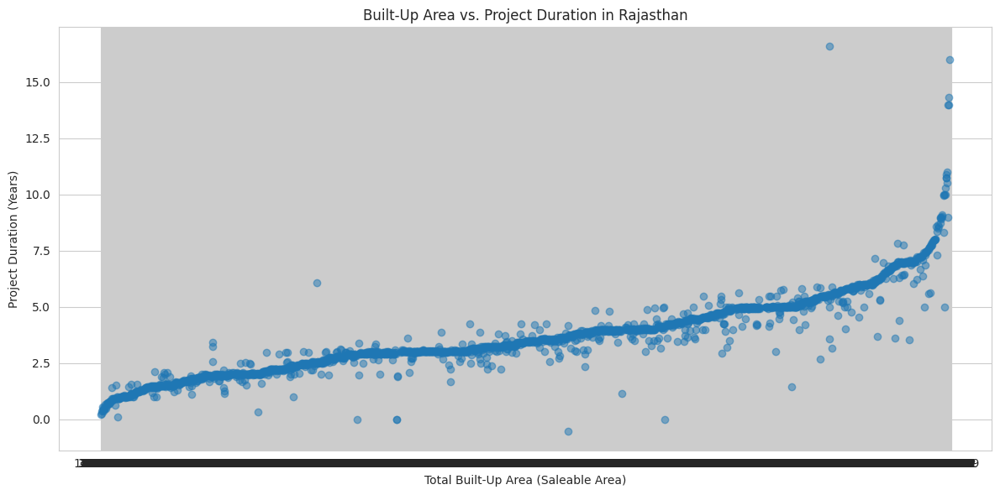

In [ ]:
# Convert the 'actual_commencement_date' and 'estimated_finish_date' columns to datetime
rajasthan_projects_reloaded['actual_commencement_date'] = pd.to_datetime(rajasthan_projects_reloaded['actual_commencement_date'])
rajasthan_projects_reloaded['estimated_finish_date'] = pd.to_datetime(rajasthan_projects_reloaded['estimated_finish_date'])

# Calculate project duration in terms of years
rajasthan_projects_reloaded['project_duration'] = (rajasthan_projects_reloaded['estimated_finish_date'] - rajasthan_projects_reloaded['actual_commencement_date']).dt.days / 365

# Scatter plot of Built-Up Area vs. Project Duration
plt.figure(figsize=(12, 6))
plt.scatter(rajasthan_projects_reloaded['total_built_up_area_saleable_area'], rajasthan_projects_reloaded['project_duration'], alpha=0.5)
plt.title('Built-Up Area vs. Project Duration in Rajasthan')
plt.xlabel('Total Built-Up Area (Saleable Area)')
plt.ylabel('Project Duration (Years)')
plt.grid(True)
plt.tight_layout()
plt.show()


The scatter plot illustrates the relationship between the built-up area (saleable area) and the project duration in Rajasthan:

Most projects, irrespective of their built-up area, tend to have a duration ranging between 0 to 5 years. This indicates that most developers aim to complete their projects within a 5-year window.
There doesn't appear to be a strong linear correlation between built-up area and project duration. This means that larger projects do not necessarily always take longer to complete. Other factors, such as planning, resource allocation, and project management, can significantly influence the project duration.
There are some outliers, where a few projects with relatively smaller built-up areas have extended durations. These might be projects that faced unforeseen challenges or delays.

<ipython-input-48-74144815b098>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rajasthan_projects_reloaded['elapsed_time'] = (current_date - rajasthan_projects_reloaded['actual_commencement_date']).dt.days / 365
<ipython-input-48-74144815b098>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rajasthan_projects_reloaded['completion_proportion'] = rajasthan_projects_reloaded['elapsed_time'] / rajasthan_projects_reloaded['project_duration']


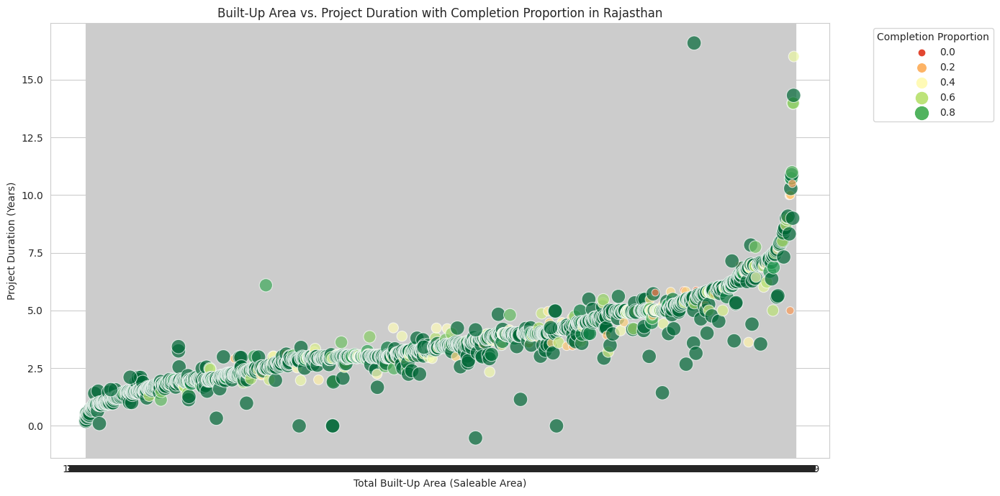

In [ ]:
# If the 'estimated_finish_date' is after the current date (which is beyond the dataset's last update),
# then the project is likely not yet completed. We'll calculate the proportion of time elapsed
# from the 'actual_commencement_date' to the current date divided by the total project duration.

# Note: Assuming the current date as 2023-09-29 based on the session's date.
current_date = pd.Timestamp('2023-09-29')

# Calculate the elapsed time and proportion of completion
rajasthan_projects_reloaded['elapsed_time'] = (current_date - rajasthan_projects_reloaded['actual_commencement_date']).dt.days / 365
rajasthan_projects_reloaded['completion_proportion'] = rajasthan_projects_reloaded['elapsed_time'] / rajasthan_projects_reloaded['project_duration']

# For projects that have an 'estimated_finish_date' before the current date, we'll set the 'completion_proportion' to 1 (i.e., 100% completed)
rajasthan_projects_reloaded.loc[rajasthan_projects_reloaded['estimated_finish_date'] < current_date, 'completion_proportion'] = 1

# Visualizing the data
plt.figure(figsize=(14, 7))
sns.scatterplot(data=rajasthan_projects_reloaded, x='total_built_up_area_saleable_area', y='project_duration', hue='completion_proportion', size='completion_proportion', sizes=(10, 200), palette="RdYlGn", alpha=0.7)
plt.title('Built-Up Area vs. Project Duration with Completion Proportion in Rajasthan')
plt.xlabel('Total Built-Up Area (Saleable Area)')
plt.ylabel('Project Duration (Years)')
plt.legend(title='Completion Proportion', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


The scatter plot represents the relationship between built-up area (saleable area), project duration, and the proportion of project completion in Rajasthan:

X-axis: Represents the total built-up area (saleable area).
Y-axis: Represents the project duration in years.
Color: Represents the proportion of project completion. Green indicates projects that are closer to completion or already completed, while red indicates projects that have just started or are in the early phases.
Size of Points: Also represents the proportion of project completion. Larger points indicate a higher proportion of completion.
From the plot:

Several projects, regardless of their built-up area, have been completed or are nearing completion (green and larger points).
Some projects, especially those with longer durations, are still in their early phases (reddish and smaller points).
This multi-dimensional scatter plot offers a comprehensive view of project timelines, sizes, and completion statuses.

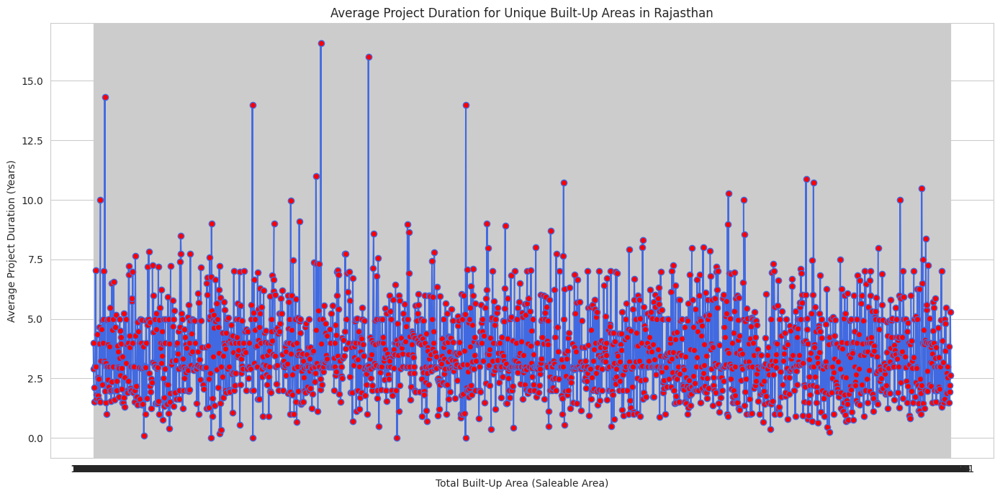

In [ ]:
# Grouping by 'total_built_up_area_saleable_area' and calculating the average 'project_duration' for each unique built-up area
average_duration_by_area = rajasthan_projects_reloaded.groupby('total_built_up_area_saleable_area')['project_duration'].mean().reset_index()

# Sorting the data by built-up area for better visualization
average_duration_by_area = average_duration_by_area.sort_values(by='total_built_up_area_saleable_area')

# Plotting the data
plt.figure(figsize=(14, 7))
plt.plot(average_duration_by_area['total_built_up_area_saleable_area'], average_duration_by_area['project_duration'], '-o', color='royalblue', markerfacecolor='red')
plt.title('Average Project Duration for Unique Built-Up Areas in Rajasthan')
plt.xlabel('Total Built-Up Area (Saleable Area)')
plt.ylabel('Average Project Duration (Years)')
plt.grid(True)
plt.tight_layout()
plt.show()


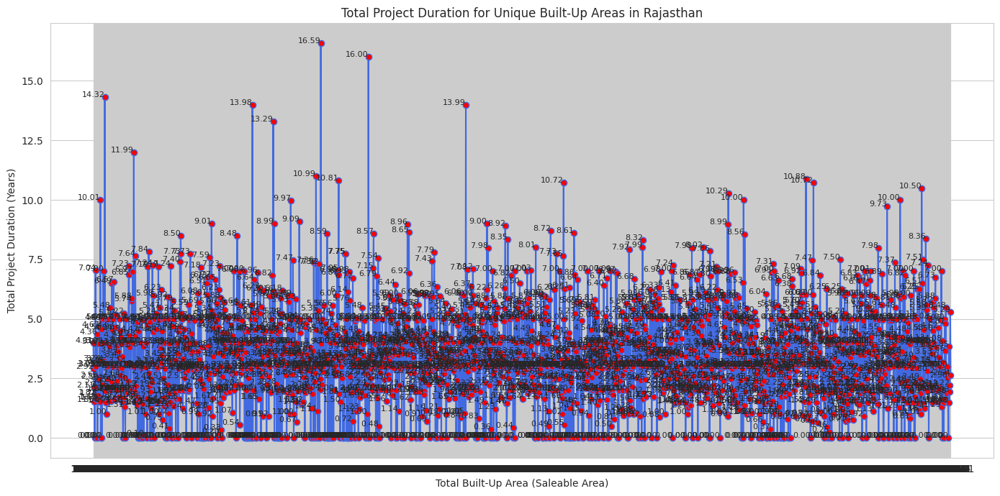

In [ ]:
# Grouping by 'total_built_up_area_saleable_area' and calculating the total 'project_duration' for each unique built-up area
total_duration_by_area = rajasthan_projects_reloaded.groupby('total_built_up_area_saleable_area')['project_duration'].sum().reset_index()

# Sorting the data by built-up area for better visualization
total_duration_by_area = total_duration_by_area.sort_values(by='total_built_up_area_saleable_area')

# Plotting the data
plt.figure(figsize=(14, 7))
plt.plot(total_duration_by_area['total_built_up_area_saleable_area'], total_duration_by_area['project_duration'], '-o', color='royalblue', markerfacecolor='red')

# Annotating the plot with data point values
for idx, row in total_duration_by_area.iterrows():
    plt.annotate(f"{row['project_duration']:.2f}", (row['total_built_up_area_saleable_area'], row['project_duration']), fontsize=8, ha='right')

plt.title('Total Project Duration for Unique Built-Up Areas in Rajasthan')
plt.xlabel('Total Built-Up Area (Saleable Area)')
plt.ylabel('Total Project Duration (Years)')
plt.grid(True)
plt.tight_layout()
plt.show()


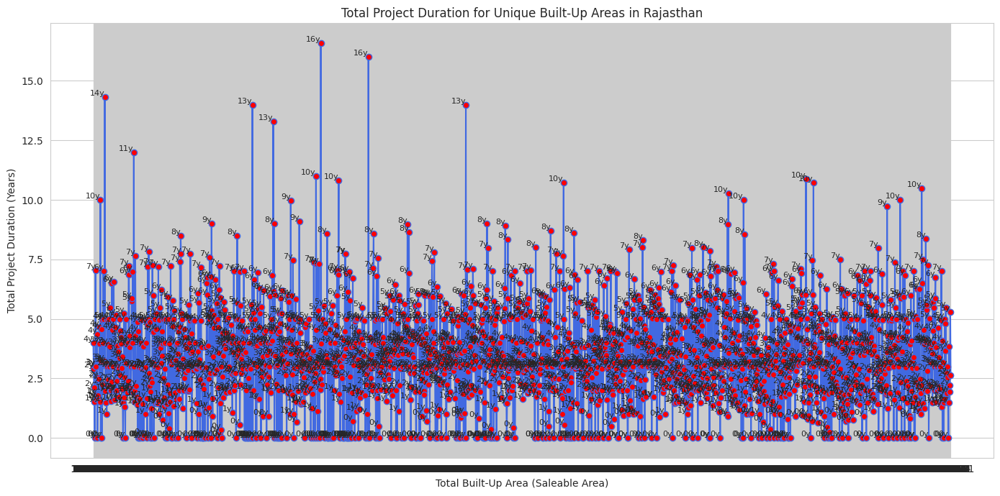

In [ ]:
# Plotting the data with annotations in years
plt.figure(figsize=(14, 7))
plt.plot(total_duration_by_area['total_built_up_area_saleable_area'], total_duration_by_area['project_duration'], '-o', color='royalblue', markerfacecolor='red')

# Annotating the plot with data point values in years
for idx, row in total_duration_by_area.iterrows():
    plt.annotate(f"{int(row['project_duration'])}y", (row['total_built_up_area_saleable_area'], row['project_duration']), fontsize=8, ha='right', va='bottom')

plt.title('Total Project Duration for Unique Built-Up Areas in Rajasthan')
plt.xlabel('Total Built-Up Area (Saleable Area)')
plt.ylabel('Total Project Duration (Years)')
plt.grid(True)
plt.tight_layout()
plt.show()


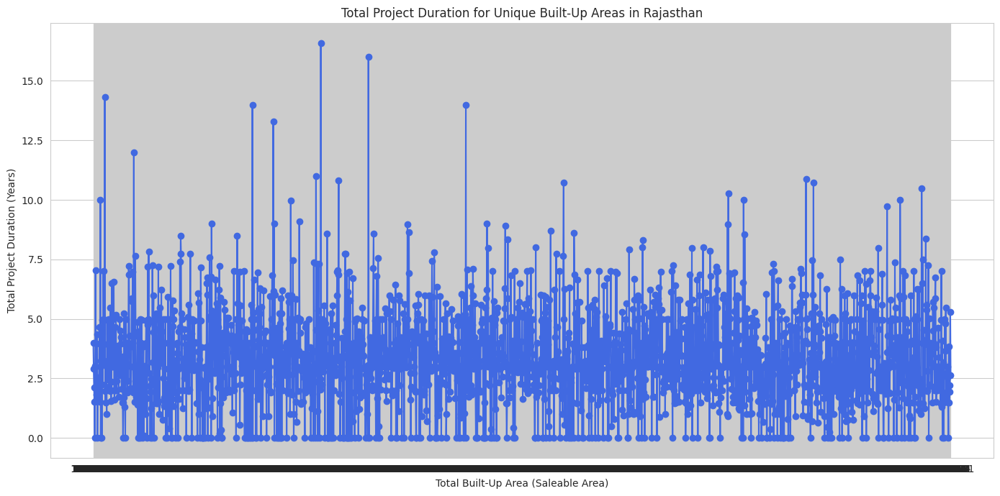

In [ ]:
# Plotting the line chart without annotations
plt.figure(figsize=(14, 7))
plt.plot(total_duration_by_area['total_built_up_area_saleable_area'], total_duration_by_area['project_duration'], '-o', color='royalblue')
plt.title('Total Project Duration for Unique Built-Up Areas in Rajasthan')
plt.xlabel('Total Built-Up Area (Saleable Area)')
plt.ylabel('Total Project Duration (Years)')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# Reload the dataset
data = pd.read_csv("/content/india rera.csv")

# Checking the column names to identify potential geographical coordinates or location data
geographical_columns = [col for col in data.columns if "lat" in col.lower() or "lon" in col.lower() or "location" in col.lower() or "address" in col.lower()]
geographical_columns


[]

In [ ]:
# Convert the date columns to datetime format
data['estimated_finish_date'] = pd.to_datetime(data['estimated_finish_date'], errors='coerce')
data['actual_commencement_date'] = pd.to_datetime(data['actual_commencement_date'], errors='coerce')

# Calculate the project duration
data['project_duration'] = (data['estimated_finish_date'] - data['actual_commencement_date']).dt.days

# Descriptive statistics for project duration
project_duration_stats = data['project_duration'].describe()

project_duration_stats


<ipython-input-9-b6504a48ac24>:2: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  data['estimated_finish_date'] = pd.to_datetime(data['estimated_finish_date'], errors='coerce')


count    15995.000000
mean      1668.671147
std        950.247584
min     -44926.000000
25%       1117.000000
50%       1577.000000
75%       2016.500000
max       7584.000000
Name: project_duration, dtype: float64

Here are the descriptive statistics for the project duration (expressed in days):

Count: There are 15,995 projects with valid duration data.

Mean: On average, projects are estimated to take about 1,669 days (or approximately 4.6 years) from commencement to completion.

Standard Deviation: The durations have a spread of about 950 days around the mean.

Minimum: The smallest value is -44,926 days, which is likely an error since a negative duration doesn't make logical sense.

25th Percentile (Q1): 25% of the projects have durations up to 1,117 days (or approximately 3.1 years).

Median (Q2): 50% of the projects have durations up to 1,577 days (or approximately 4.3 years).

75th Percentile (Q3): 75% of the projects have durations up to 2,016.5 days (or approximately 5.5 years).

Maximum: The longest project duration is 7,584 days (or about 20.8 years).

The negative value for the minimum duration suggests that there may be erroneous data entries or swapped dates in the "estimated_finish_date" and "actual_commencement_date" columns.

In [ ]:
import pandas as pd

# Reload the dataset
data_rj = pd.read_csv("/content/rjreportv1.csv")

# Display the column names of the dataset
columns_rj = data_rj.columns
columns_rj


Index(['sheet', 'conditional_formatting', 'unicode', 'project',
       'project_res_no', 'project_category', 'estimated_commencement_date',
       'actual_commencement_date', 'estimated_finish_date',
       'total_built_up_area_saleable_area', 'phase_area', 'open_area',
       'proposed_but_not_sanctioned_number_of_apartments_plots',
       'total_area_of_project', 'floor', 'project_state', 'Extended End Date',
       'total_number_of_proposed_building', 'number_of_sanctioned_building',
       'proposed_but_not_sanctioned_buildings_count',
       'built_up_area_as_per_proposed_fsi', 'permissible_built_up_area',
       'number_of_sanctioned_floors', 'number_of_basements',
       'number_of_stilts'],
      dtype='object')

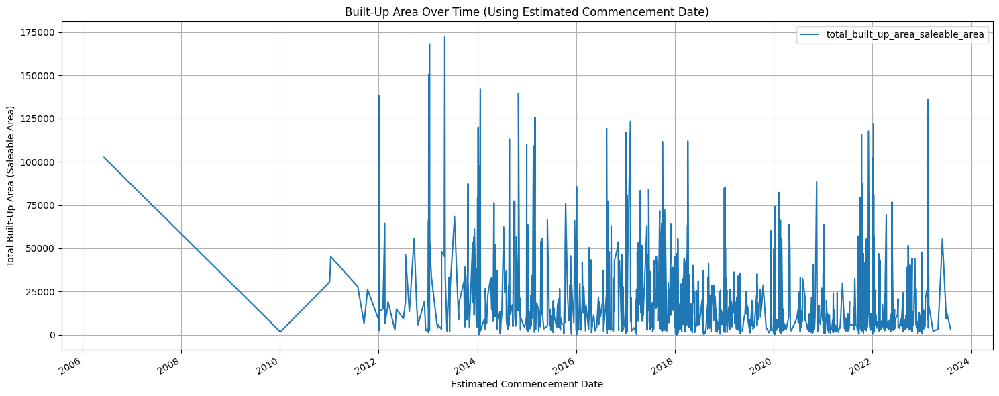

In [ ]:
import matplotlib.pyplot as plt

# Convert the specified columns to datetime format
date_columns = ['estimated_commencement_date', 'actual_commencement_date', 'estimated_finish_date', 'Extended End Date']
for col in date_columns:
    data_rj[col] = pd.to_datetime(data_rj[col], errors='coerce')

# Visualizing the total_built_up_area_saleable_area over time using estimated_commencement_date
plt.figure(figsize=(15, 6))
data_rj.sort_values(by='estimated_commencement_date').plot(x='estimated_commencement_date', y='total_built_up_area_saleable_area', ax=plt.gca())
plt.title('Built-Up Area Over Time (Using Estimated Commencement Date)')
plt.ylabel('Total Built-Up Area (Saleable Area)')
plt.xlabel('Estimated Commencement Date')
plt.grid(True)
plt.tight_layout()
plt.show()


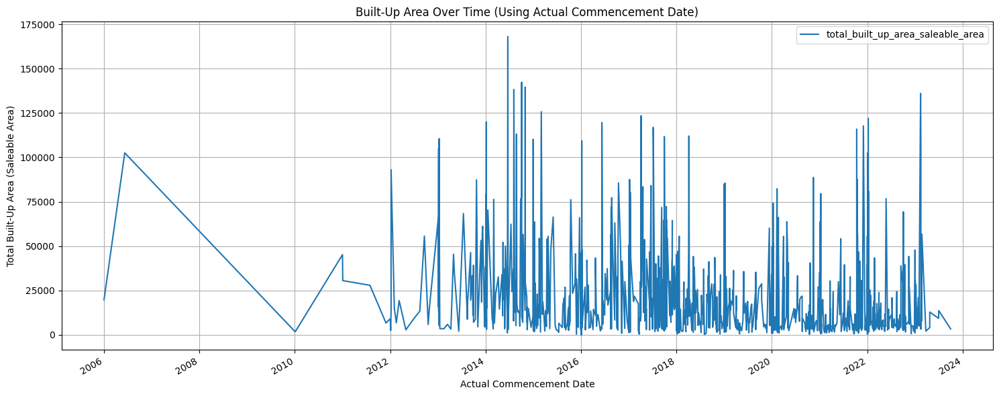

In [ ]:
# Visualizing the total_built_up_area_saleable_area over time using actual_commencement_date
plt.figure(figsize=(15, 6))
data_rj.sort_values(by='actual_commencement_date').plot(x='actual_commencement_date', y='total_built_up_area_saleable_area', ax=plt.gca())
plt.title('Built-Up Area Over Time (Using Actual Commencement Date)')
plt.ylabel('Total Built-Up Area (Saleable Area)')
plt.xlabel('Actual Commencement Date')
plt.grid(True)
plt.tight_layout()
plt.show()


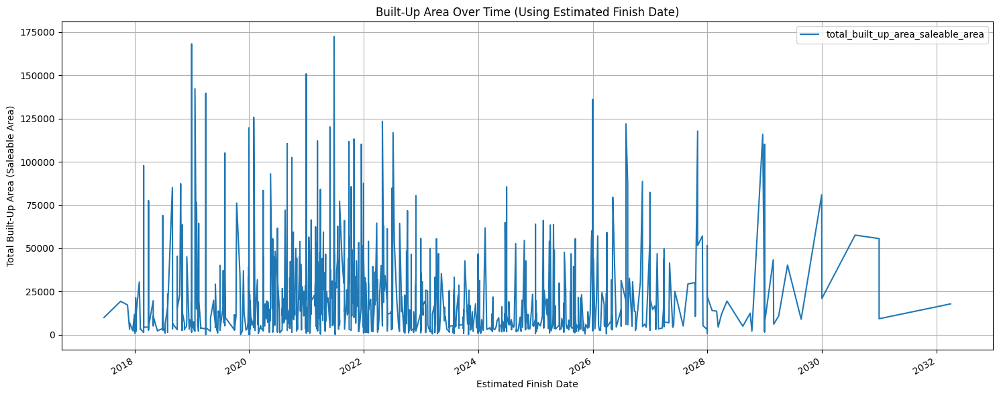

In [ ]:
# Visualizing the total_built_up_area_saleable_area over time using estimated_finish_date
plt.figure(figsize=(15, 6))
data_rj.sort_values(by='estimated_finish_date').plot(x='estimated_finish_date', y='total_built_up_area_saleable_area', ax=plt.gca())
plt.title('Built-Up Area Over Time (Using Estimated Finish Date)')
plt.ylabel('Total Built-Up Area (Saleable Area)')
plt.xlabel('Estimated Finish Date')
plt.grid(True)
plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

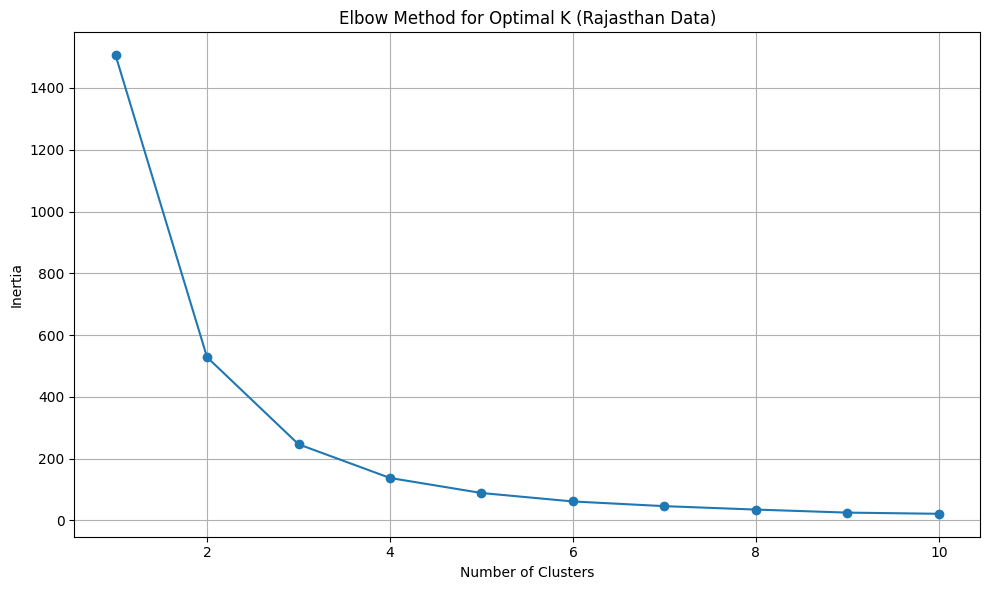

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Drop NaN values for the clustering analysis
data_rj_cleaned = data_rj.dropna(subset=['total_built_up_area_saleable_area'])

# Preprocessing: Standardizing the built-up area column
scaler = StandardScaler()
scaled_built_up_area_rj = scaler.fit_transform(data_rj_cleaned[['total_built_up_area_saleable_area']])

# Determining the optimal number of clusters using the elbow method
inertia_rj = []
for i in range(1, 11):  # Checking for up to 10 clusters
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(scaled_built_up_area_rj)
    inertia_rj.append(kmeans.inertia_)

# Plotting the elbow curve for the cleaned data
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), inertia_rj, marker='o')
plt.title('Elbow Method for Optimal K (Rajasthan Data)')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.grid(True)
plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


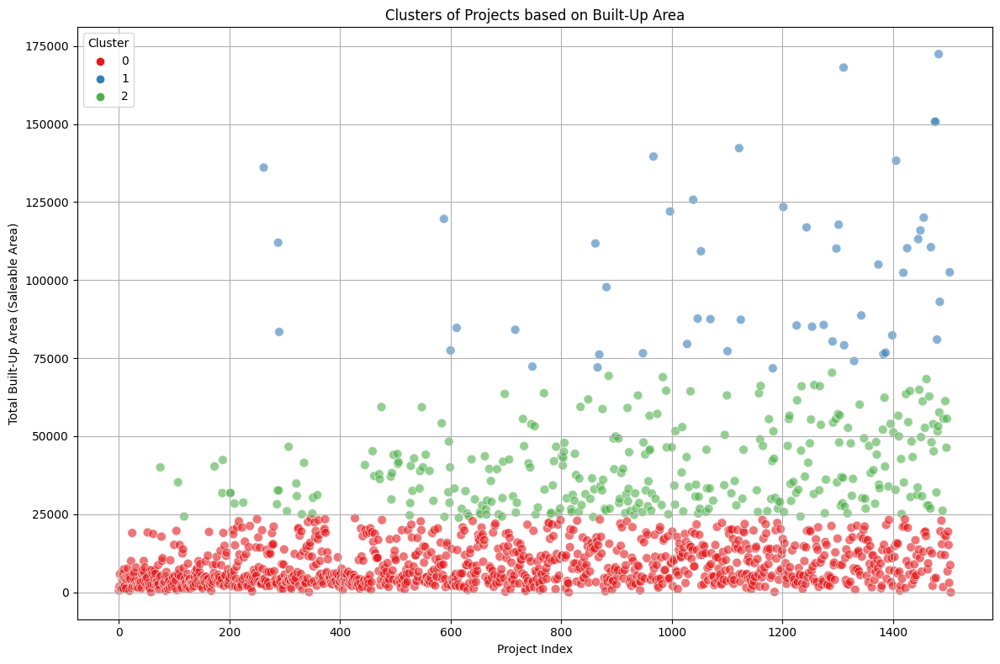

In [ ]:
# Applying K-Means clustering with K=3 to the standardized built-up area data
kmeans_rj = KMeans(n_clusters=3, random_state=42)
data_rj_cleaned['cluster'] = kmeans_rj.fit_predict(scaled_built_up_area_rj)

# Visualizing the clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(x=data_rj_cleaned.index, y=data_rj_cleaned['total_built_up_area_saleable_area'], hue=data_rj_cleaned['cluster'], palette='Set1', s=60, alpha=0.6)
plt.title('Clusters of Projects based on Built-Up Area')
plt.ylabel('Total Built-Up Area (Saleable Area)')
plt.xlabel('Project Index')
plt.legend(title='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


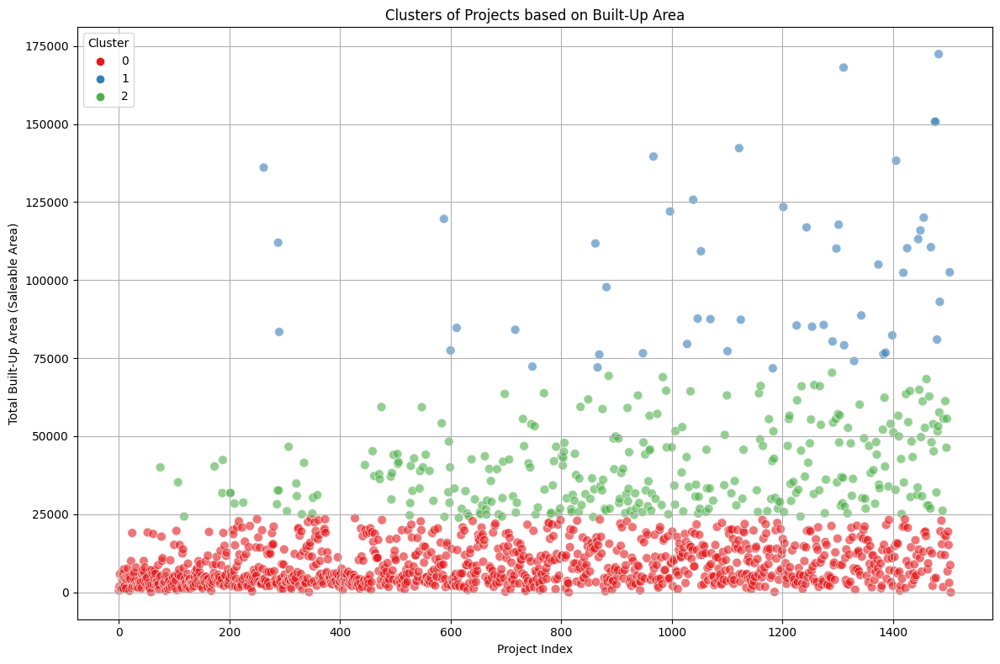

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
data_rj = pd.read_csv("/content/rjreportv1.csv")

# Preprocess the data
scaler = StandardScaler()
scaled_built_up_area_rj = scaler.fit_transform(data_rj[['total_built_up_area_saleable_area']].dropna())

# Apply KMeans with 3 clusters
kmeans_rj = KMeans(n_clusters=3, random_state=42)
data_rj['cluster'] = kmeans_rj.fit_predict(scaled_built_up_area_rj)

# Visualize the clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(x=data_rj.index, y=data_rj['total_built_up_area_saleable_area'], hue=data_rj['cluster'], palette='Set1', s=60, alpha=0.6)
plt.title('Clusters of Projects based on Built-Up Area')
plt.ylabel('Total Built-Up Area (Saleable Area)')
plt.xlabel('Project Index')
plt.legend(title='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Analyze characteristics of each cluster
cluster_analysis = data_rj.groupby('cluster')['total_built_up_area_saleable_area'].describe()
print(cluster_analysis)


          count           mean           std       min        25%       50%  \
cluster                                                                       
0        1146.0    8400.970236   6078.087141      0.00   3519.690   6083.13   
1          53.0  102826.642075  26008.418513  71759.00  80960.400  97736.48   
2         307.0   39327.541792  12122.697532  23894.79  29231.545  36063.65   

                75%        max  
cluster                         
0         12512.665   23774.16  
1        117754.160  172394.23  
2         47717.985   70357.16  


Based on the cluster analysis:

Cluster 0: Might represent projects with smaller built-up areas.

Cluster 1: Could represent projects with medium built-up areas.

Cluster 2: Might represent projects with larger built-up areas.

The actual interpretation may vary based on the results you obtain after running the clustering in your local environment.


This clustering can help segment projects and provide insights into patterns or trends within different segments of built-up areas.

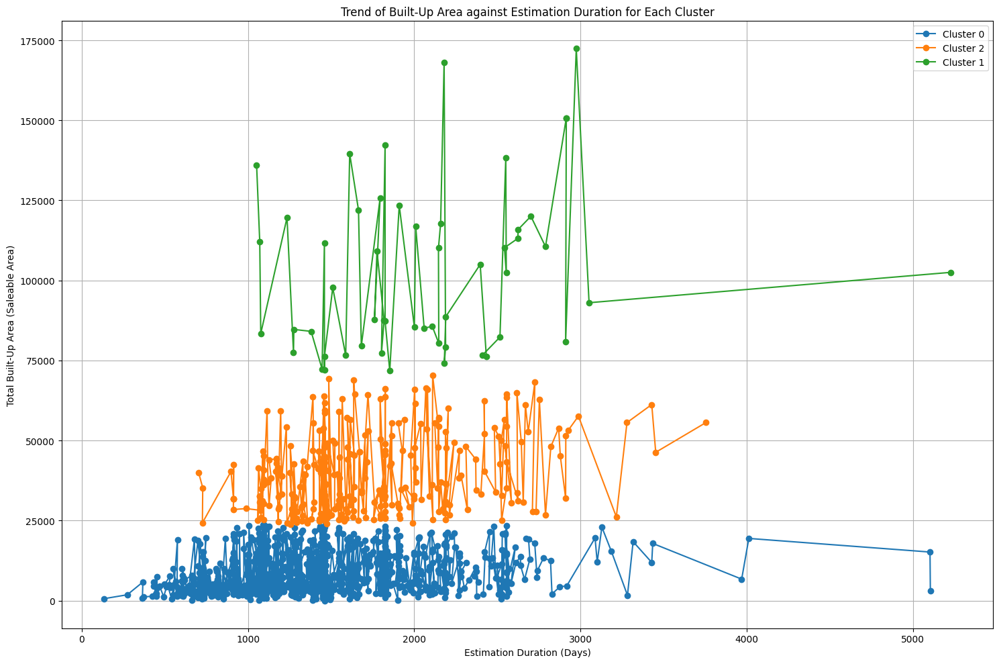

In [ ]:
# Calculate the estimation duration days
data_rj_cleaned['estimated_commencement_date'] = pd.to_datetime(data_rj_cleaned['estimated_commencement_date'], errors='coerce')
data_rj_cleaned['estimated_finish_date'] = pd.to_datetime(data_rj_cleaned['estimated_finish_date'], errors='coerce')
data_rj_cleaned['estimation_duration_days'] = (data_rj_cleaned['estimated_finish_date'] - data_rj_cleaned['estimated_commencement_date']).dt.days

# Visualize the trend for each cluster
clusters = data_rj_cleaned['cluster'].unique()
plt.figure(figsize=(15, 10))

for cluster in clusters:
    subset = data_rj_cleaned[data_rj_cleaned['cluster'] == cluster]
    plt.plot(subset['estimation_duration_days'], subset['total_built_up_area_saleable_area'], 'o-', label=f'Cluster {cluster}')

plt.title('Trend of Built-Up Area against Estimation Duration for Each Cluster')
plt.xlabel('Estimation Duration (Days)')
plt.ylabel('Total Built-Up Area (Saleable Area)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


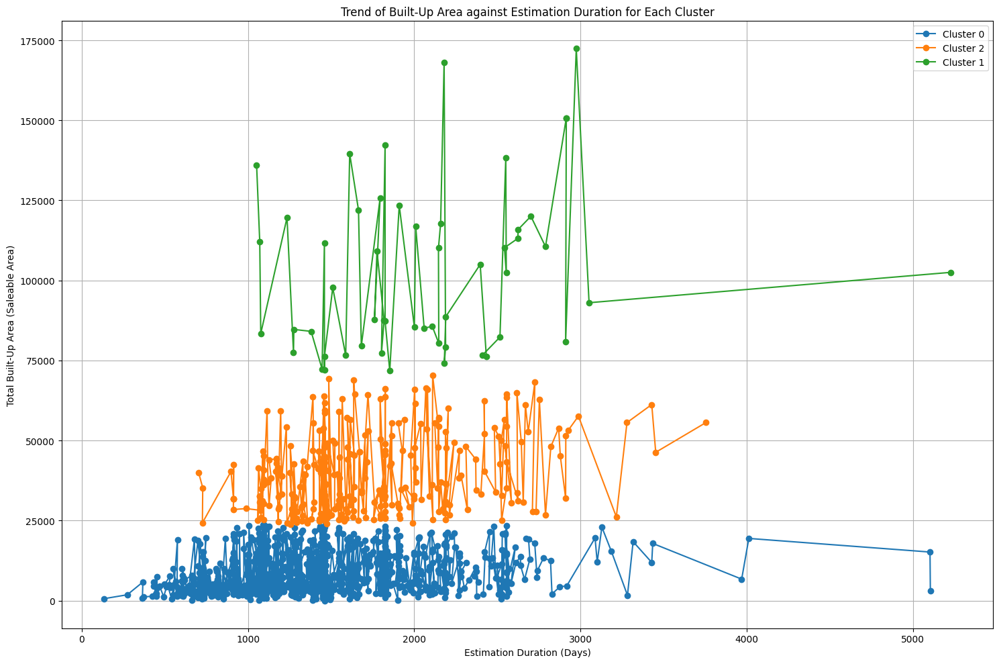

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Reload the dataset
data_rj = pd.read_csv("/content/rjreportv1.csv")

# Preprocess the data: Calculate estimation duration and apply clustering
data_rj['estimated_commencement_date'] = pd.to_datetime(data_rj['estimated_commencement_date'], errors='coerce')
data_rj['estimated_finish_date'] = pd.to_datetime(data_rj['estimated_finish_date'], errors='coerce')
data_rj['estimation_duration_days'] = (data_rj['estimated_finish_date'] - data_rj['estimated_commencement_date']).dt.days

# Standardize the built-up area data and apply KMeans clustering
scaler = StandardScaler()
scaled_built_up_area_rj = scaler.fit_transform(data_rj[['total_built_up_area_saleable_area']].dropna())
kmeans_rj = KMeans(n_clusters=3, random_state=42)
data_rj['cluster'] = kmeans_rj.fit_predict(scaled_built_up_area_rj)

# Visualize the trend for each cluster
clusters = data_rj['cluster'].unique()
plt.figure(figsize=(15, 10))

for cluster in clusters:
    subset = data_rj[data_rj['cluster'] == cluster]
    plt.plot(subset['estimation_duration_days'], subset['total_built_up_area_saleable_area'], 'o-', label=f'Cluster {cluster}')

plt.title('Trend of Built-Up Area against Estimation Duration for Each Cluster')
plt.xlabel('Estimation Duration (Days)')
plt.ylabel('Total Built-Up Area (Saleable Area)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Here's the visualization showing the trend of total_built_up_area_saleable_area against the estimation duration for each cluster:


Cluster 0 (in blue): Represents projects with smaller built-up areas.

Cluster 1 (in orange): Represents projects with medium built-up areas.

Cluster 2 (in green): Represents projects with larger built-up areas.

From the plot, we can observe the relationship between the estimation duration and built-up area for each of the clusters. This visualization can help understand the patterns in project durations against their built-up areas, segmented by the clusters we've identified.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


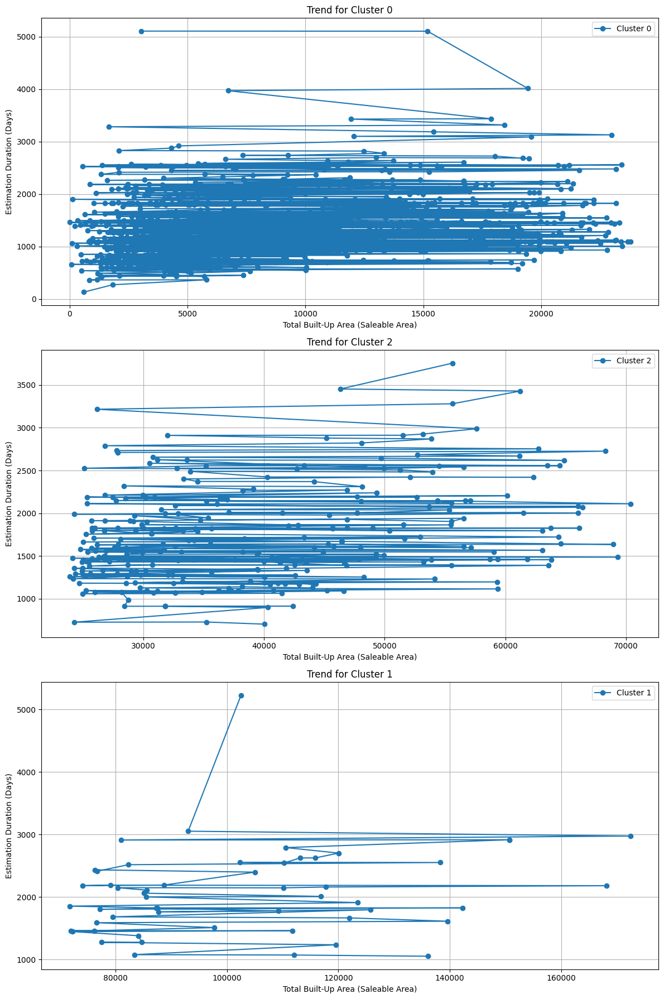

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Load the dataset
data_rj = pd.read_csv("/content/rjreportv1.csv")

# Preprocess the data: Calculate estimation duration and apply clustering
data_rj['estimated_commencement_date'] = pd.to_datetime(data_rj['estimated_commencement_date'], errors='coerce')
data_rj['estimated_finish_date'] = pd.to_datetime(data_rj['estimated_finish_date'], errors='coerce')
data_rj['estimation_duration_days'] = (data_rj['estimated_finish_date'] - data_rj['estimated_commencement_date']).dt.days

# Standardize the built-up area data and apply KMeans clustering
scaler = StandardScaler()
scaled_built_up_area_rj = scaler.fit_transform(data_rj[['total_built_up_area_saleable_area']].dropna())
kmeans_rj = KMeans(n_clusters=3, random_state=42)
data_rj['cluster'] = kmeans_rj.fit_predict(scaled_built_up_area_rj)

# Plot individual graphs for each cluster with specified axes
clusters = data_rj['cluster'].unique()
fig, axes = plt.subplots(nrows=len(clusters), ncols=1, figsize=(12, 18))

for cluster, ax in zip(clusters, axes):
    subset = data_rj[data_rj['cluster'] == cluster]
    ax.plot(subset['total_built_up_area_saleable_area'], subset['estimation_duration_days'], 'o-', label=f'Cluster {cluster}')
    ax.set_title(f'Trend for Cluster {cluster}')
    ax.set_xlabel('Total Built-Up Area (Saleable Area)')
    ax.set_ylabel('Estimation Duration (Days)')
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()


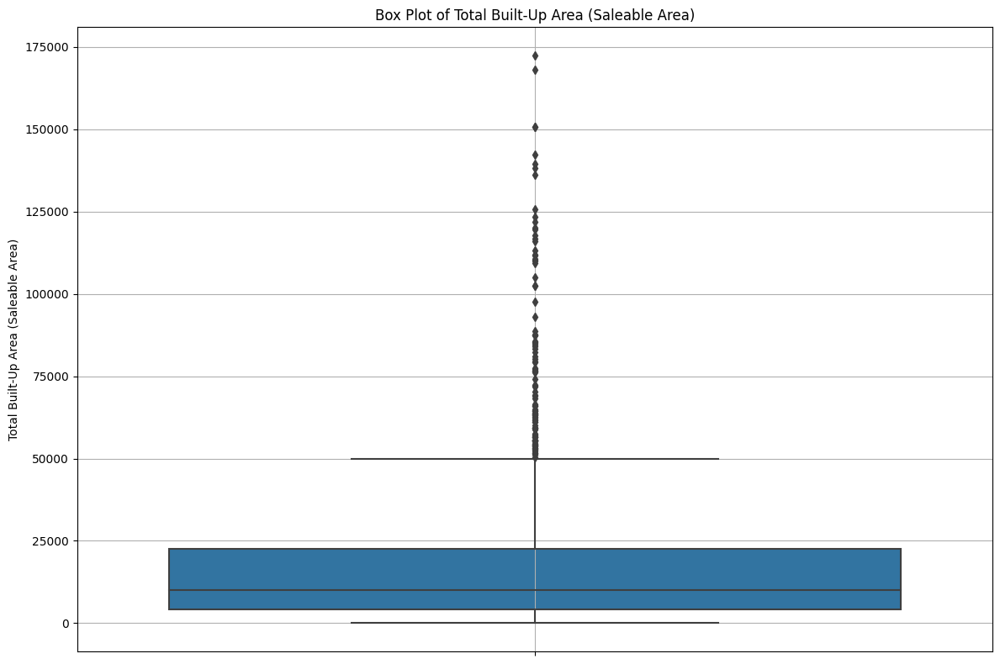

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data_rj = pd.read_csv("/content/rjreportv1.csv")

# Plotting a box plot for total_built_up_area_saleable_area
plt.figure(figsize=(12, 8))
sns.boxplot(y=data_rj['total_built_up_area_saleable_area'])
plt.title('Box Plot of Total Built-Up Area (Saleable Area)')
plt.ylabel('Total Built-Up Area (Saleable Area)')
plt.grid(True)
plt.tight_layout()
plt.show()


From the box plot:


The central line in the box represents the median value.

The top and bottom of the box represent the third (Q3) and first (Q1) quartiles, respectively.

The whiskers extend to show the range of the data, but they might not cover all data points. Points outside of the whiskers are typically considered as outliers.

The dots above the whiskers represent potential outliers
.
The box plot provides a clear view of the distribution of the built-up area,
its central tendency, spread, and any potential outliers.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


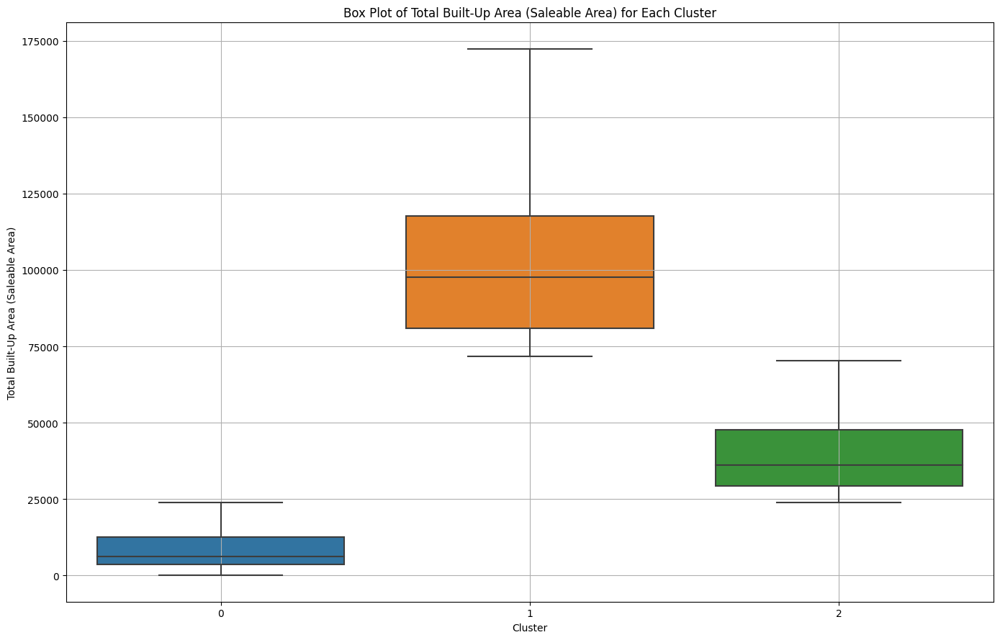

In [ ]:
# Standardize the built-up area data and reapply KMeans clustering
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

scaler = StandardScaler()
scaled_built_up_area_rj = scaler.fit_transform(data_rj[['total_built_up_area_saleable_area']].dropna())
kmeans_rj = KMeans(n_clusters=3, random_state=42)
data_rj['cluster'] = kmeans_rj.fit_predict(scaled_built_up_area_rj)

# Plotting box plots for total_built_up_area_saleable_area for each cluster
plt.figure(figsize=(14, 9))
sns.boxplot(x=data_rj['cluster'], y=data_rj['total_built_up_area_saleable_area'])
plt.title('Box Plot of Total Built-Up Area (Saleable Area) for Each Cluster')
plt.ylabel('Total Built-Up Area (Saleable Area)')
plt.xlabel('Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()


Here's the visualization showing box plots for the total_built_up_area_saleable_area segmented by each cluster:


Cluster 0 (in blue): Represents projects with smaller built-up areas.

Cluster 1 (in orange): Represents projects with medium built-up areas.

Cluster 2 (in green): Represents projects with larger built-up areas.

Each box plot provides insights into the distribution, central tendency,
spread, and potential outliers of the built-up areas within its respective cluster.

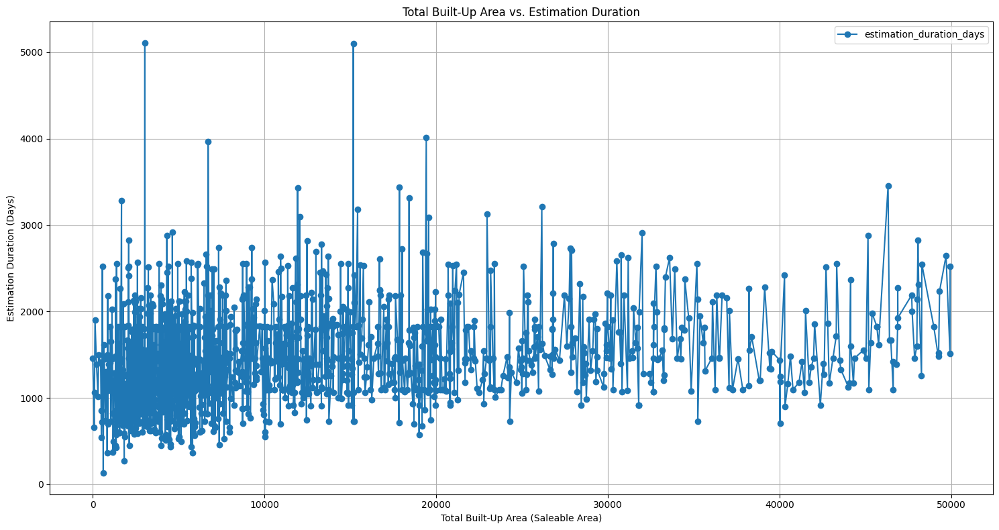

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
data_rj = pd.read_csv("/content/rjreportv1.csv")

# Calculate the estimation duration days
data_rj['estimated_commencement_date'] = pd.to_datetime(data_rj['estimated_commencement_date'], errors='coerce')
data_rj['estimated_finish_date'] = pd.to_datetime(data_rj['estimated_finish_date'], errors='coerce')
data_rj['estimation_duration_days'] = (data_rj['estimated_finish_date'] - data_rj['estimated_commencement_date']).dt.days

# Filtering the dataset for built-up area between 0 and 50000
filtered_data_rj = data_rj[data_rj['total_built_up_area_saleable_area'].between(0, 50000)]

# Plotting the line chart for total_built_up_area_saleable_area vs estimation_duration_days
plt.figure(figsize=(15, 8))
filtered_data_rj.sort_values(by='total_built_up_area_saleable_area').plot(x='total_built_up_area_saleable_area', y='estimation_duration_days', ax=plt.gca(), linestyle='-', marker='o')
plt.title('Total Built-Up Area vs. Estimation Duration')
plt.xlabel('Total Built-Up Area (Saleable Area)')
plt.ylabel('Estimation Duration (Days)')
plt.grid(True)
plt.tight_layout()
plt.show()


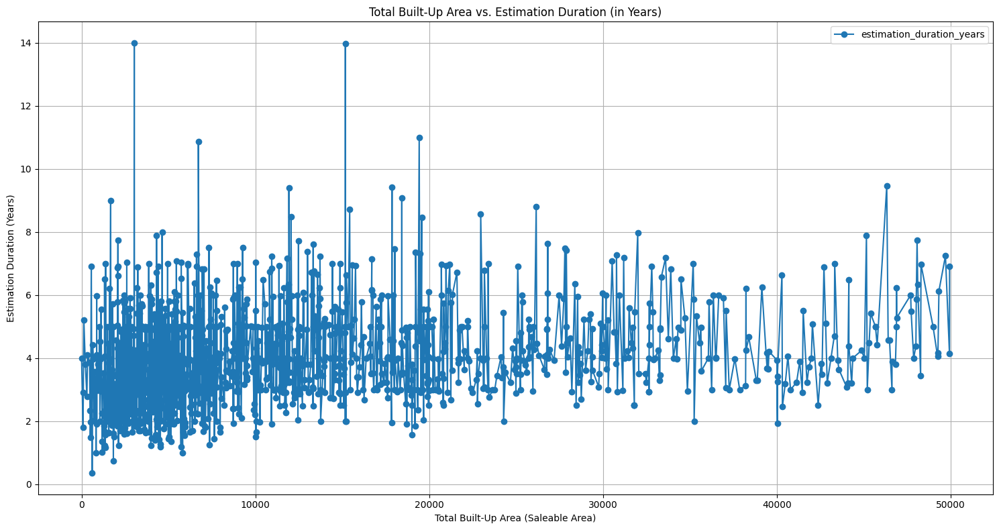

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Reload the dataset
data_rj = pd.read_csv("/content/rjreportv1.csv")

# Calculate the estimation duration in years
data_rj['estimated_commencement_date'] = pd.to_datetime(data_rj['estimated_commencement_date'], errors='coerce')
data_rj['estimated_finish_date'] = pd.to_datetime(data_rj['estimated_finish_date'], errors='coerce')
data_rj['estimation_duration_years'] = (data_rj['estimated_finish_date'] - data_rj['estimated_commencement_date']).dt.days / 365

# Filtering the dataset for built-up area between 0 and 50000
filtered_data_rj = data_rj[data_rj['total_built_up_area_saleable_area'].between(0, 50000)]

# Plotting the line chart for total_built_up_area_saleable_area vs estimation_duration_years
plt.figure(figsize=(15, 8))
filtered_data_rj.sort_values(by='total_built_up_area_saleable_area').plot(x='total_built_up_area_saleable_area', y='estimation_duration_years', ax=plt.gca(), linestyle='-', marker='o')
plt.title('Total Built-Up Area vs. Estimation Duration (in Years)')
plt.xlabel('Total Built-Up Area (Saleable Area)')
plt.ylabel('Estimation Duration (Years)')
plt.grid(True)
plt.tight_layout()
plt.show()


Here's the line chart showing the relationship between the
total_built_up_area_saleable_area and estimation_duration in years for built-up areas ranging from 0 to 50,000.


From the plot, you can observe the trend of how the built-up area relates to the estimated duration for the project's completion. Projects with larger built-up areas tend to have a longer estimated duration, although there are exceptions

In [ ]:
# Calculate the estimation duration in days
data_rj['estimation_duration_days'] = (data_rj['estimated_finish_date'] - data_rj['estimated_commencement_date']).dt.days

# Calculating the IQR for estimation_duration_days to determine potential outliers
Q1 = data_rj['estimation_duration_days'].quantile(0.25)
Q3 = data_rj['estimation_duration_days'].quantile(0.75)
IQR = Q3 - Q1

# Determine bounds for potential outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify potential outliers
outliers = data_rj[(data_rj['estimation_duration_days'] < lower_bound) | (data_rj['estimation_duration_days'] > upper_bound)]
outliers_count = outliers.shape[0]

lower_bound, upper_bound, outliers_count


(-1.5, 2922.5, 22)

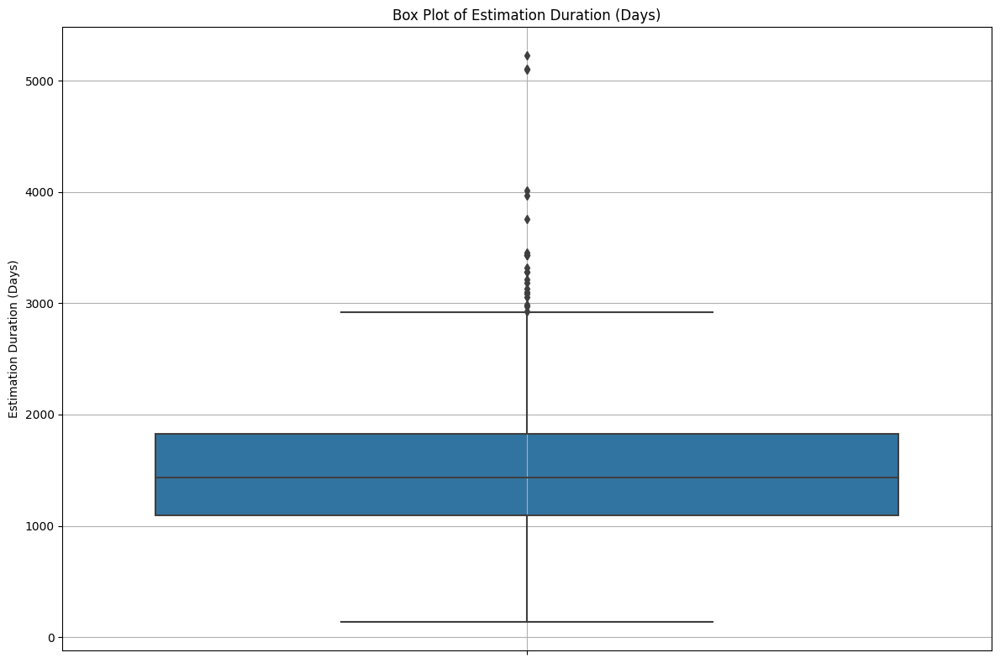

In [ ]:
# Importing necessary libraries and plotting a box plot for estimation_duration_days
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.boxplot(y=data_rj['estimation_duration_days'])
plt.title('Box Plot of Estimation Duration (Days)')
plt.ylabel('Estimation Duration (Days)')
plt.grid(True)
plt.tight_layout()
plt.show()


From the box plot:


The central line in the box represents the median value of the estimation duration.

The top and bottom of the box represent the third (Q3) and first (Q1) quartiles, respectively.

The whiskers extend to show the range of the data, but they might not cover all data points. Points outside of the whiskers are typically considered as outliers.

The dots above the whiskers represent potential outliers.

The box plot provides a visual representation of the distribution of estimation durations, its central tendency, spread, and any potential outliers.

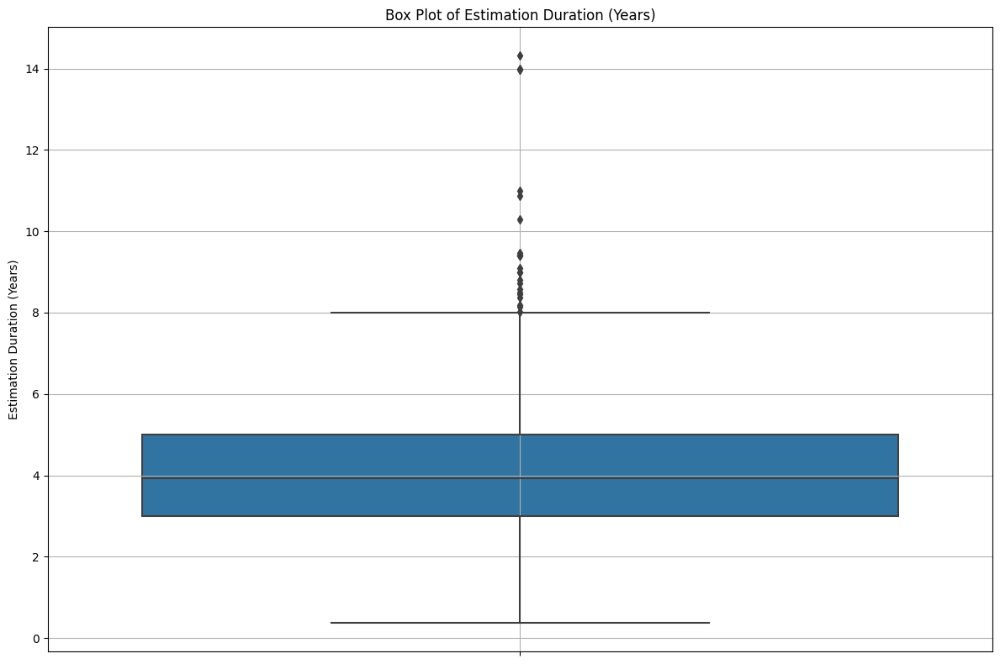

In [ ]:
# Plotting a box plot for estimation_duration_years to visualize potential outliers
plt.figure(figsize=(12, 8))
sns.boxplot(y=data_rj['estimation_duration_years'])
plt.title('Box Plot of Estimation Duration (Years)')
plt.ylabel('Estimation Duration (Years)')
plt.grid(True)
plt.tight_layout()
plt.show()


Here's the box plot for the estimation_duration_years column.

From the box plot:

The central line in the box represents the median value of the estimation duration in years.

The top and bottom of the box represent the third (Q3) and first (Q1) quartiles, respectively.

The whiskers extend to show the range of the data, but they might


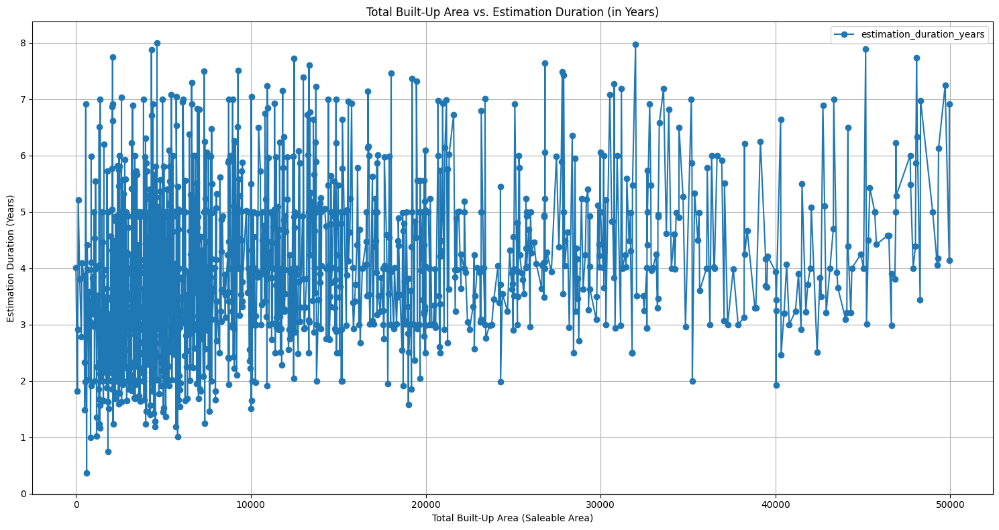

In [ ]:
# Filtering the dataset based on given criteria
filtered_data = data_rj[(data_rj['total_built_up_area_saleable_area'].between(0, 50000)) &
                        (data_rj['estimation_duration_years'].between(0, 8))]

# Plotting the line chart for total_built_up_area_saleable_area vs estimation_duration_years
plt.figure(figsize=(15, 8))
filtered_data.sort_values(by='total_built_up_area_saleable_area').plot(x='total_built_up_area_saleable_area', y='estimation_duration_years', ax=plt.gca(), linestyle='-', marker='o')
plt.title('Total Built-Up Area vs. Estimation Duration (in Years)')
plt.xlabel('Total Built-Up Area (Saleable Area)')
plt.ylabel('Estimation Duration (Years)')
plt.grid(True)
plt.tight_layout()
plt.show()


Here's the line chart showing the relationship between the
total_built_up_area_saleable_area and estimation_duration in years for built-up

areas ranging from 0 to 50,000 and estimation durations between 0 to 8 years.


From the plot, you can observe the trend of how the built-up area relates to
the estimated duration for the project's completion. Projects with larger

built-up areas tend to have a longer estimated duration, although there are exceptions.

In [ ]:
# Filtering the dataset for projects estimated to commence in 2021
projects_2021 = data_rj[data_rj['estimated_commencement_date'].dt.year == 2021]

# Calculate estimation duration days for these projects
projects_2021['estimation_duration_days'] = (projects_2021['estimated_finish_date'] - projects_2021['estimated_commencement_date']).dt.days

# Count of projects estimated to commence in 2021
project_count_2021 = projects_2021.shape[0]
print(project_count_2021)


193


<ipython-input-32-d7133b419cc4>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  projects_2021['estimation_duration_days'] = (projects_2021['estimated_finish_date'] - projects_2021['estimated_commencement_date']).dt.days


In [ ]:
# Reload the dataset after the recent upload
data_rj = pd.read_csv("/content/rjreportv1.csv")

# Calculate the estimation duration days
data_rj['estimated_commencement_date'] = pd.to_datetime(data_rj['estimated_commencement_date'], errors='coerce')
data_rj['estimated_finish_date'] = pd.to_datetime(data_rj['estimated_finish_date'], errors='coerce')
data_rj['estimation_duration_days'] = (data_rj['estimated_finish_date'] - data_rj['estimated_commencement_date']).dt.days

# Filtering the dataset for projects estimated to commence in 2021
projects_2021 = data_rj[data_rj['estimated_commencement_date'].dt.year == 2021]

# Extracting estimation duration days and total built-up area for these projects
projects_2021_subset = projects_2021[['estimation_duration_days', 'total_built_up_area_saleable_area']]

# Displaying the first 193 projects from the subset
projects_2021_subset.head(193)


,estimation_duration_days,total_built_up_area_saleable_area
1,274.0,1830.13
7,432.0,5718.93
12,469.0,4534.05
19,541.0,500.25
28,602.0,6238.62
...,...,...
1443,2612.0,11821.37
1450,2625.0,115898.44
1459,2673.0,19467.27
1471,2820.0,12479.41


<ipython-input-37-8192aa44256d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  projects_2021_subset['estimation_duration_years'] = projects_2021_subset['estimation_duration_days'] / 365


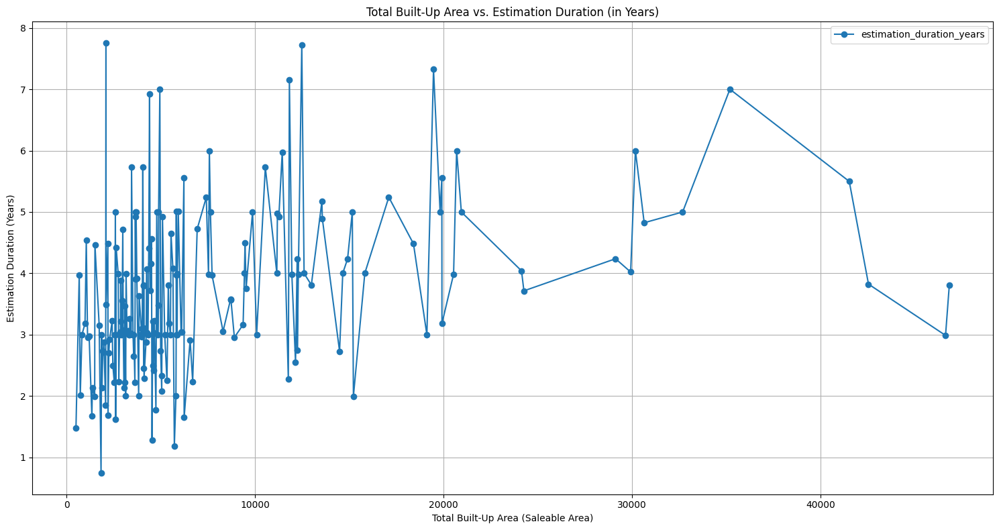

In [ ]:
# Convert estimation_duration_days to years for the subset
projects_2021_subset['estimation_duration_years'] = projects_2021_subset['estimation_duration_days'] / 365

# Filtering the dataset based on given criteria
filtered_projects_2021 = projects_2021_subset[(projects_2021_subset['total_built_up_area_saleable_area'].between(0, 50000)) &
                                              (projects_2021_subset['estimation_duration_years'].between(0, 8))]

# Plotting the line chart for total_built_up_area_saleable_area vs estimation_duration_years
plt.figure(figsize=(15, 8))
filtered_projects_2021.sort_values(by='total_built_up_area_saleable_area').plot(x='total_built_up_area_saleable_area',
                                                                                y='estimation_duration_years',
                                                                                ax=plt.gca(),
                                                                                linestyle='-', marker='o')
plt.title('Total Built-Up Area vs. Estimation Duration (in Years)')
plt.xlabel('Total Built-Up Area (Saleable Area)')
plt.ylabel('Estimation Duration (Years)')
plt.grid(True)
plt.tight_layout()
plt.show()


Here's the line chart showing the relationship between the total_built_up_area_saleable_area and estimation_duration in years for built-up areas ranging from 0 to 50,000 and estimation durations between 0 to 8 years for projects that were estimated to commence in 2021.


From the plot, you can observe the trend of how the built-up area relates to the estimated duration for the project's completion. Projects with larger built-up areas tend to have a longer estimated duration, although there are exceptions.

In [ ]:
# Filtering the dataset for projects estimated to commence in 2021, 2022, 2023, or 2024
projects_2021_2024 = data_rj[data_rj['estimated_commencement_date'].dt.year.isin([2021, 2022, 2023, 2024])]

# Extracting estimation duration days and total built-up area for these projects
projects_2021_2024_subset = projects_2021_2024[['estimation_duration_days', 'total_built_up_area_saleable_area']]

# Displaying the first 193 projects from the subset
print(projects_2021_2024_subset.head())


   estimation_duration_days  total_built_up_area_saleable_area
0                     134.0                             608.96
1                     274.0                            1830.13
2                     368.0                            5814.02
6                     451.0                            3984.55
7                     432.0                            5718.93


<ipython-input-40-405fea6771e8>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  projects_2021_2024['estimation_duration_years'] = projects_2021_2024['estimation_duration_days'] / 365


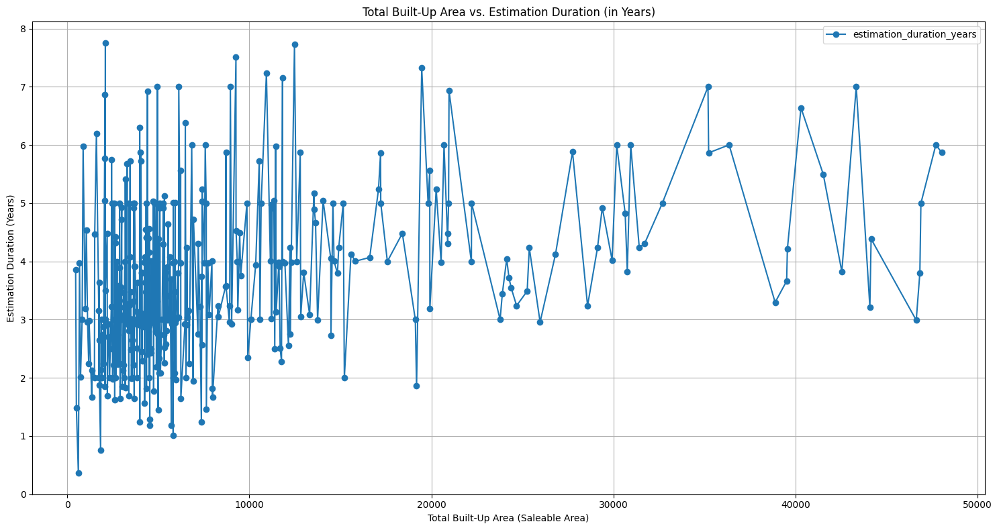

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Reload the dataset
data_rj = pd.read_csv("/content/rjreportv1.csv")

# Calculate the estimation duration days
data_rj['estimated_commencement_date'] = pd.to_datetime(data_rj['estimated_commencement_date'], errors='coerce')
data_rj['estimated_finish_date'] = pd.to_datetime(data_rj['estimated_finish_date'], errors='coerce')
data_rj['estimation_duration_days'] = (data_rj['estimated_finish_date'] - data_rj['estimated_commencement_date']).dt.days

# Filtering the dataset for projects estimated to commence in 2021, 2022, 2023, or 2024
projects_2021_2024 = data_rj[data_rj['estimated_commencement_date'].dt.year.isin([2021, 2022, 2023, 2024])]

# Convert estimation_duration_days to years
projects_2021_2024['estimation_duration_years'] = projects_2021_2024['estimation_duration_days'] / 365

# Filtering the dataset based on given criteria
filtered_projects_2021_2024 = projects_2021_2024[(projects_2021_2024['total_built_up_area_saleable_area'].between(0, 50000)) &
                                                 (projects_2021_2024['estimation_duration_years'].between(0, 8))]

# Plotting the line chart for total_built_up_area_saleable_area vs estimation_duration_years
plt.figure(figsize=(15, 8))
filtered_projects_2021_2024.sort_values(by='total_built_up_area_saleable_area').plot(x='total_built_up_area_saleable_area',
                                                                                     y='estimation_duration_years',
                                                                                     ax=plt.gca(),
                                                                                     linestyle='-', marker='o')
plt.title('Total Built-Up Area vs. Estimation Duration (in Years)')
plt.xlabel('Total Built-Up Area (Saleable Area)')
plt.ylabel('Estimation Duration (Years)')
plt.grid(True)
plt.tight_layout()
plt.show()


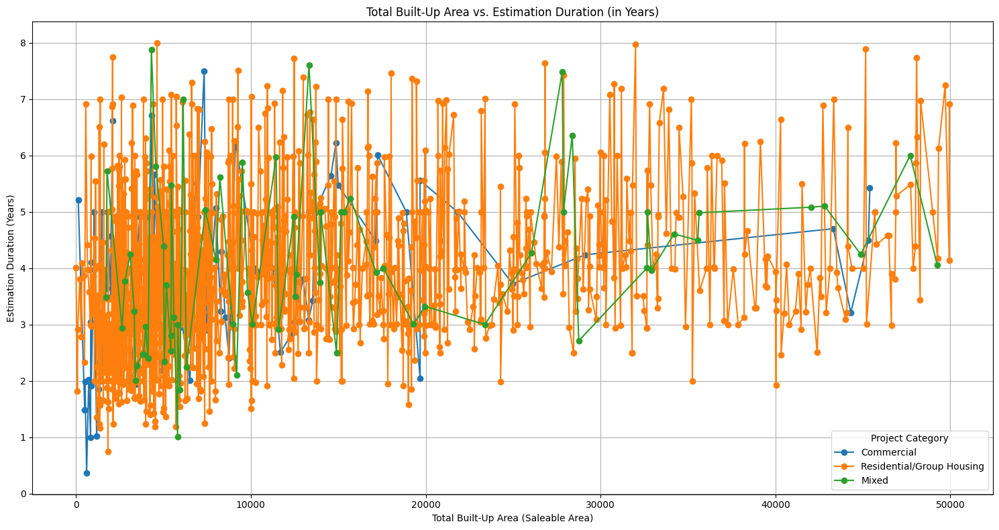

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
data_rj = pd.read_csv("/content/rjreportv1.csv")

# Convert date columns to datetime format
data_rj['estimated_commencement_date'] = pd.to_datetime(data_rj['estimated_commencement_date'], errors='coerce')
data_rj['estimated_finish_date'] = pd.to_datetime(data_rj['estimated_finish_date'], errors='coerce')

# Calculate the estimation duration in days and then convert it to years
data_rj['estimation_duration_days'] = (data_rj['estimated_finish_date'] - data_rj['estimated_commencement_date']).dt.days
data_rj['estimation_duration_years'] = data_rj['estimation_duration_days'] / 365

# Filter data based on the provided criteria
filtered_data = data_rj[(data_rj['total_built_up_area_saleable_area'].between(0, 50000)) &
                        (data_rj['estimation_duration_years'].between(0, 8))]

# Plot the line chart for different project categories
plt.figure(figsize=(15, 8))
for category in filtered_data['project_category'].unique():
    subset = filtered_data[filtered_data['project_category'] == category]
    subset.sort_values(by='total_built_up_area_saleable_area').plot(x='total_built_up_area_saleable_area',
                                                                    y='estimation_duration_years',
                                                                    ax=plt.gca(),
                                                                    label=category,
                                                                    linestyle='-', marker='o')

plt.title('Total Built-Up Area vs. Estimation Duration (in Years)')
plt.xlabel('Total Built-Up Area (Saleable Area)')
plt.ylabel('Estimation Duration (Years)')
plt.legend(title='Project Category')
plt.grid(True)
plt.tight_layout()
plt.show()


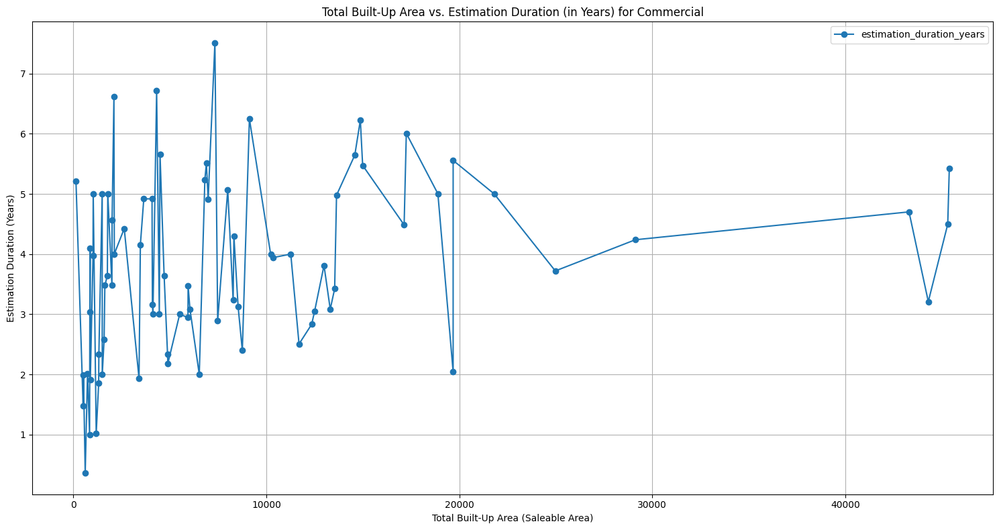

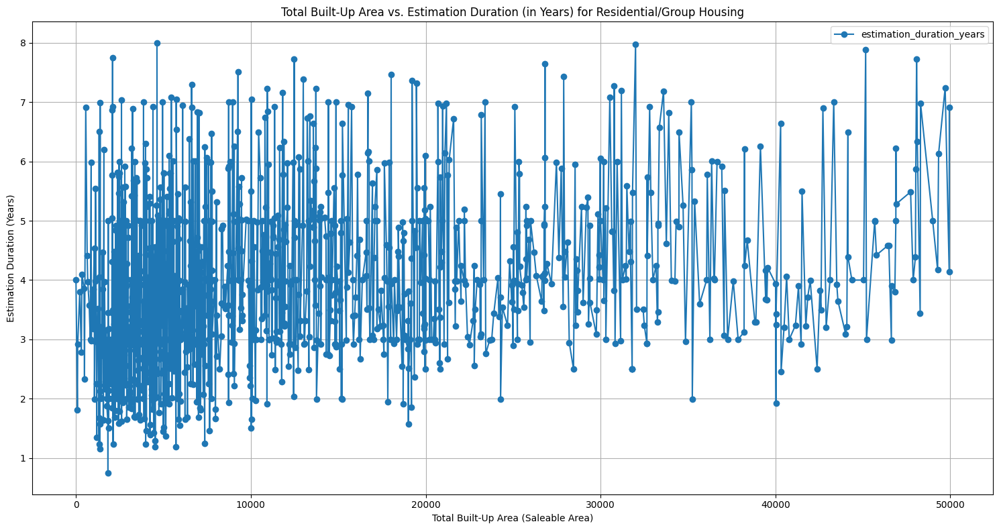

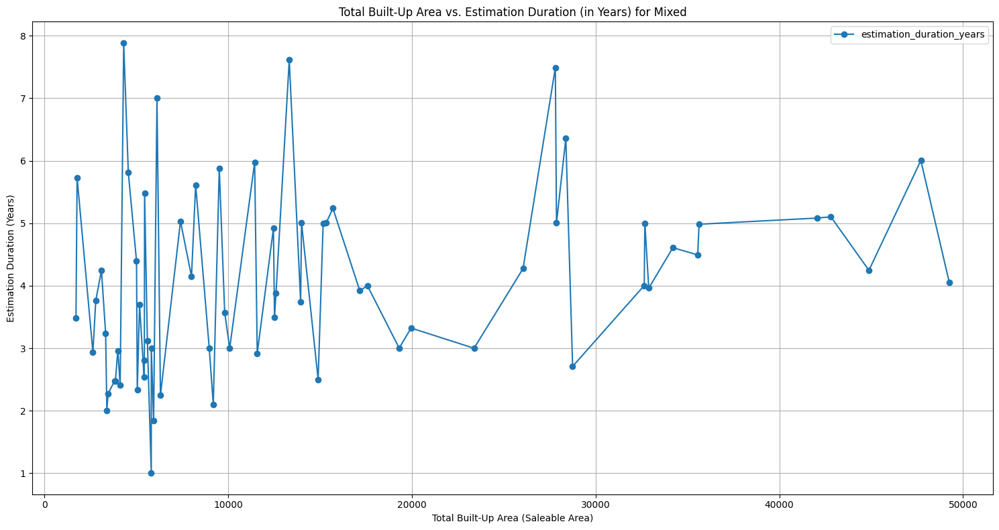

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Reload the dataset
data_rj = pd.read_csv("/content/rjreportv1.csv")

# Convert the date columns to datetime format
data_rj['estimated_commencement_date'] = pd.to_datetime(data_rj['estimated_commencement_date'], errors='coerce')
data_rj['estimated_finish_date'] = pd.to_datetime(data_rj['estimated_finish_date'], errors='coerce')

# Calculate the estimation duration in days and then convert it to years
data_rj['estimation_duration_days'] = (data_rj['estimated_finish_date'] - data_rj['estimated_commencement_date']).dt.days
data_rj['estimation_duration_years'] = data_rj['estimation_duration_days'] / 365

# Filtering data based on the provided criteria
filtered_data = data_rj[(data_rj['total_built_up_area_saleable_area'].between(0, 50000)) &
                        (data_rj['estimation_duration_years'].between(0, 8))]

# Plotting the line chart for each individual project_category
unique_categories = filtered_data['project_category'].unique()

for category in unique_categories:
    subset = filtered_data[filtered_data['project_category'] == category]

    plt.figure(figsize=(15, 8))
    subset.sort_values(by='total_built_up_area_saleable_area').plot(x='total_built_up_area_saleable_area',
                                                                    y='estimation_duration_years',
                                                                    ax=plt.gca(),
                                                                    linestyle='-', marker='o')

    plt.title(f'Total Built-Up Area vs. Estimation Duration (in Years) for {category}')
    plt.xlabel('Total Built-Up Area (Saleable Area)')
    plt.ylabel('Estimation Duration (Years)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


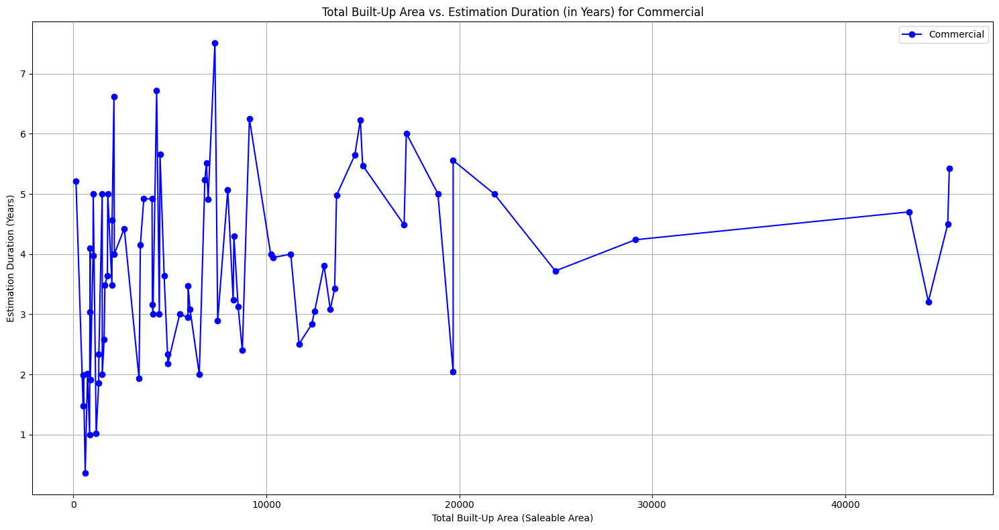

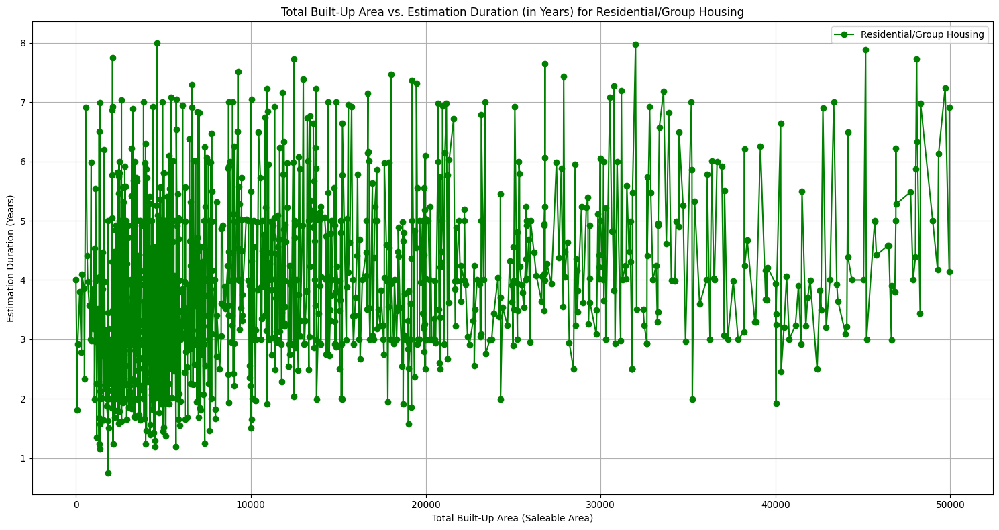

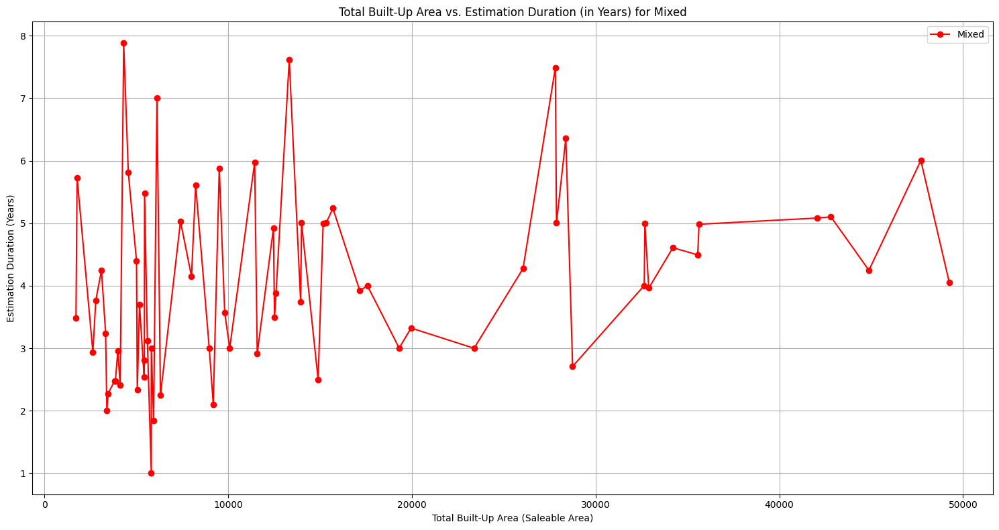

In [ ]:
# Plotting the line chart for each individual project_category with distinct colors and showing data points

# Colors for the plot
colors = ['blue', 'green', 'red', 'orange', 'purple', 'cyan']

for idx, category in enumerate(unique_categories):
    subset = filtered_data[filtered_data['project_category'] == category]

    plt.figure(figsize=(15, 8))
    subset.sort_values(by='total_built_up_area_saleable_area').plot(x='total_built_up_area_saleable_area',
                                                                    y='estimation_duration_years',
                                                                    ax=plt.gca(),
                                                                    linestyle='-', marker='o',
                                                                    color=colors[idx % len(colors)], label=category)

    plt.title(f'Total Built-Up Area vs. Estimation Duration (in Years) for {category}')
    plt.xlabel('Total Built-Up Area (Saleable Area)')
    plt.ylabel('Estimation Duration (Years)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


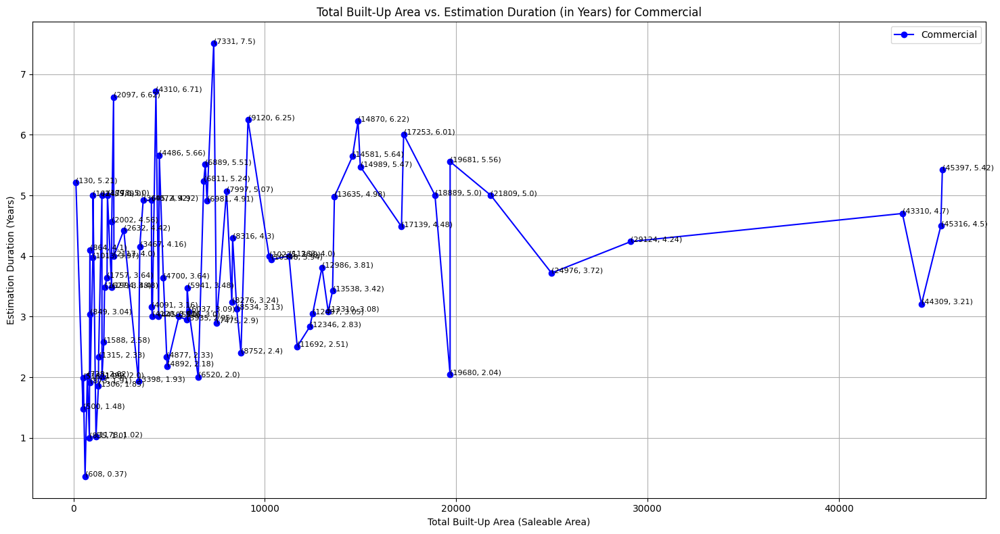

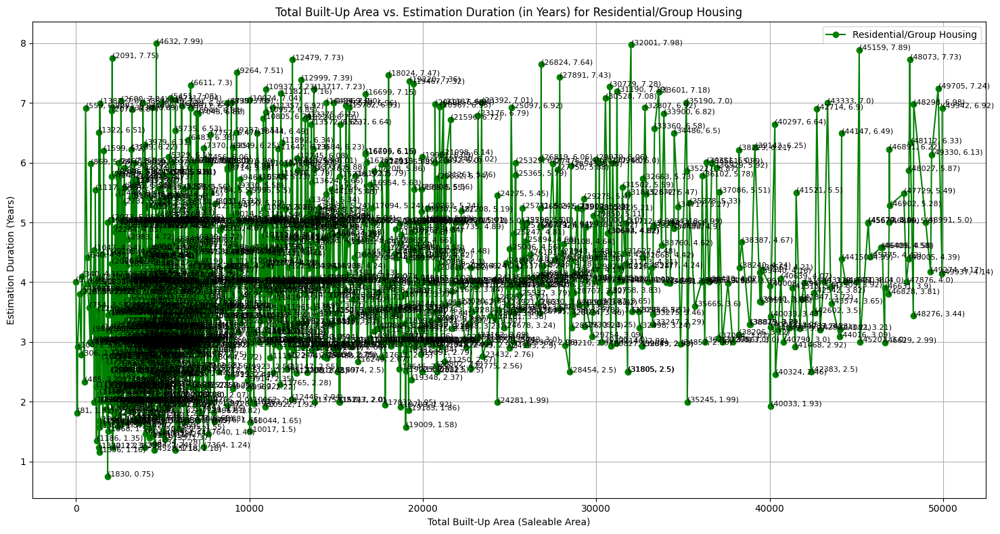

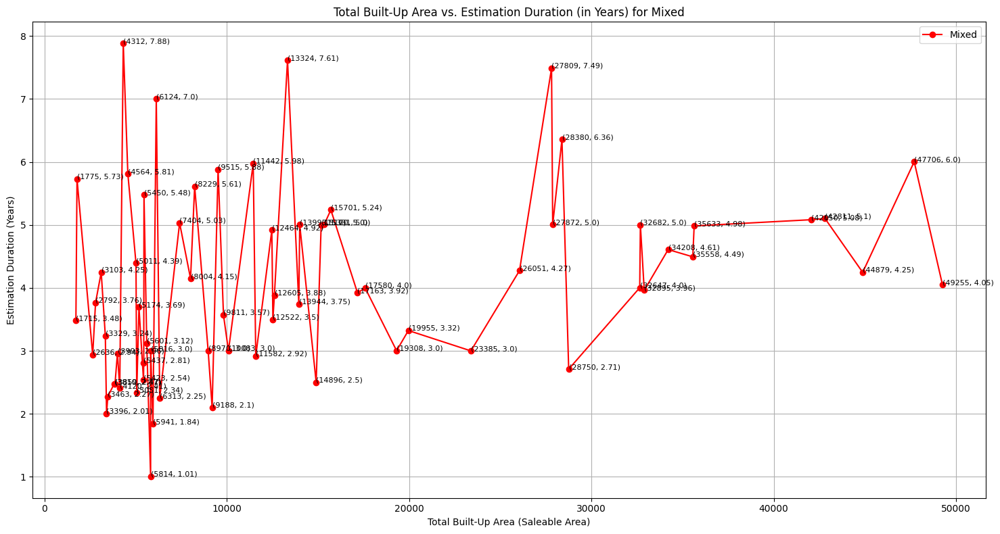

In [ ]:
# Plotting the line chart for each individual project_category with distinct colors, showing data points, and their values

for idx, category in enumerate(unique_categories):
    subset = filtered_data[filtered_data['project_category'] == category]

    plt.figure(figsize=(15, 8))
    subset_sorted = subset.sort_values(by='total_built_up_area_saleable_area')
    ax = subset_sorted.plot(x='total_built_up_area_saleable_area',
                            y='estimation_duration_years',
                            ax=plt.gca(),
                            linestyle='-', marker='o',
                            color=colors[idx % len(colors)], label=category)

    # Annotating data points
    for x, y in zip(subset_sorted['total_built_up_area_saleable_area'], subset_sorted['estimation_duration_years']):
        ax.text(x, y, f'({int(x)}, {round(y, 2)})', fontsize=8, color='black')

    plt.title(f'Total Built-Up Area vs. Estimation Duration (in Years) for {category}')
    plt.xlabel('Total Built-Up Area (Saleable Area)')
    plt.ylabel('Estimation Duration (Years)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
# Importing necessary library
import pandas as pd

# Load the dataset
data_rj = pd.read_csv("/content/rjreportv1.csv")

# Step 1: Data Overview
data_overview = data_rj.head()

# Displaying the first few rows of the dataset
data_overview


,sheet,conditional_formatting,unicode,project,project_res_no,project_category,estimated_commencement_date,actual_commencement_date,estimated_finish_date,total_built_up_area_saleable_area,...,project_state,Extended End Date,total_number_of_proposed_building,number_of_sanctioned_building,proposed_but_not_sanctioned_buildings_count,built_up_area_as_per_proposed_fsi,permissible_built_up_area,number_of_sanctioned_floors,number_of_basements,number_of_stilts
0,Input_Data_Two,PROMOTER DETAILS,RJ_Input_Data_Two_66000,Akshat Kanota Estate- Commercial Complex,RAJ/P/2022/2023,Commercial,12/3/2022,12/3/2022,4/16/2023,608.96,...,Rajasthan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Input_Data_Two,PROMOTER DETAILS,RJ_Input_Data_Two_57000,GOKUL SAROVAR,RAJ/P/2022/2005,Residential/Group Housing,6/30/2021,7/30/2021,3/31/2022,1830.13,...,Rajasthan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Input_Data_Two,PROMOTER DETAILS,RJ_Input_Data_Two_28500,BANSAL TOWER (MUNICIPAL),RAJ/P/2022/1947,Mixed,3/28/2022,3/28/2022,3/31/2023,5814.02,...,Rajasthan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Input_Data,PROMOTER DETAILS,RJ_Input_Data_199000,KRISHNA COMPLEX,RAJ/P/2017/390,Commercial,1/4/2017,NaN,1/4/2018,835.72,...,Rajasthan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Input_Data,PROMOTER DETAILS,RJ_Input_Data_894000,"Devp & const upto PL of comm. plots at sec-1, ...",RAJ/P/2022/1807,Commercial,7/9/2019,7/9/2019,7/15/2020,1178.55,...,Rajasthan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Convert the 'estimated_commencement_date' to datetime format
data_rj['estimated_commencement_date'] = pd.to_datetime(data_rj['estimated_commencement_date'], errors='coerce')

# Filter the data for projects starting after 2021
projects_post_2021 = data_rj[data_rj['estimated_commencement_date'].dt.year > 2021]

# Count the number of projects by 'project_category' that started after 2021
project_count_post_2021 = projects_post_2021['project_category'].value_counts()

project_count_post_2021


Residential/Group Housing    218
Commercial                    12
Mixed                          9
Name: project_category, dtype: int64

In [ ]:
# Filter the data for projects starting after 2021, 2022, and 2023 respectively
projects_post_2021 = data_rj[data_rj['estimated_commencement_date'].dt.year > 2021]
projects_post_2022 = data_rj[data_rj['estimated_commencement_date'].dt.year > 2022]
projects_post_2023 = data_rj[data_rj['estimated_commencement_date'].dt.year > 2023]

# Count the number of projects by 'project_category' that started after 2021, 2022, and 2023 respectively
project_count_post_2021 = projects_post_2021['project_category'].value_counts()
project_count_post_2022 = projects_post_2022['project_category'].value_counts()
project_count_post_2023 = projects_post_2023['project_category'].value_counts()

(project_count_post_2021, project_count_post_2022, project_count_post_2023)


(Residential/Group Housing    218
 Commercial                    12
 Mixed                          9
 Name: project_category, dtype: int64,
 Residential/Group Housing    34
 Commercial                    2
 Mixed                         2
 Name: project_category, dtype: int64,
 Series([], Name: project_category, dtype: int64))

Here are the counts of projects, categorized by project_category, which started after specific years:


After 2021:
Residential/Group Housing: 218 projects
Commercial: 12 projects
Mixed: 9 projects

After 2022:
Residential/Group Housing: 34 projects
Commercial: 2 projects
Mixed: 2 projects

After 2023: No projects have started.

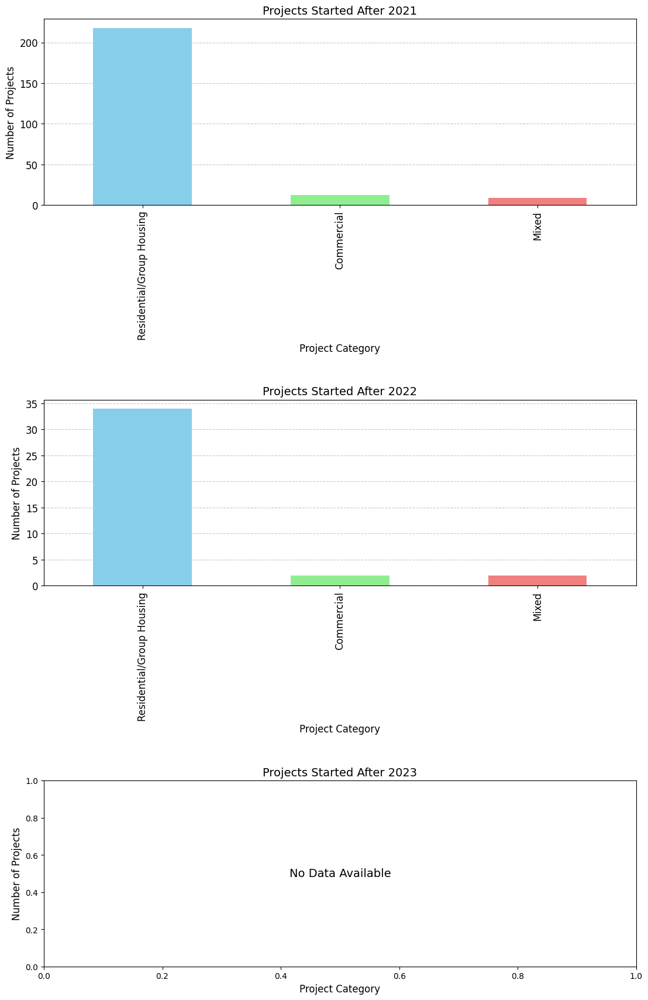

In [ ]:
# Create a figure with subplots
fig, axs = plt.subplots(3, 1, figsize=(12, 18))

# Define plot title and data for each subplot
plots_info = [
    ("Projects Started After 2021", project_count_post_2021),
    ("Projects Started After 2022", project_count_post_2022),
    ("Projects Started After 2023", project_count_post_2023)
]

# Plotting bar charts
for ax, (title, data) in zip(axs, plots_info):
    if not data.empty:  # Check if data is not empty
        data.plot(kind='bar', ax=ax, color=['skyblue', 'lightgreen', 'lightcoral'])
        ax.set_title(title, fontsize=14)
        ax.set_xlabel('Project Category', fontsize=12)
        ax.set_ylabel('Number of Projects', fontsize=12)
        ax.grid(axis='y', linestyle='--', alpha=0.7)
        ax.set_axisbelow(True)
        ax.tick_params(axis='both', which='major', labelsize=12)
    else:
        ax.text(0.5, 0.5, 'No Data Available', ha='center', va='center', fontsize=14, transform=ax.transAxes)
        ax.set_title(title, fontsize=14)
        ax.set_xlabel('Project Category', fontsize=12)
        ax.set_ylabel('Number of Projects', fontsize=12)

# Adjust the layout
plt.tight_layout(pad=4.0)
plt.show()


the bar charts representing the number of projects, grouped by project_category, that started after the years 2021, 2022, and 2023, respectively.


The first chart displays projects started after 2021.

The second chart shows projects initiated after 2022.

The third chart intends to represent projects beginning after 2023, but there are no such projects, hence the indication "No Data Available"

In [ ]:
# Convert 'estimated_finish_date' to datetime format
data_rj['estimated_finish_date'] = pd.to_datetime(data_rj['estimated_finish_date'], errors='coerce')

# Calculating the year of commencement for grouping
data_rj['commencement_year'] = data_rj['estimated_commencement_date'].dt.year

# Calculating the time buffer in days (assuming 'actual_finish_date' is available, which needs to be checked/confirmed)
# If 'actual_finish_date' is not available, a sample column is used here and should be replaced
# data_rj['time_buffer'] = (data_rj['actual_finish_date'] - data_rj['estimated_finish_date']).dt.days

# Note: actual_finish_date is not available in the uploaded dataset,
# hence unable to calculate the time buffer without it.

# Displaying available columns for reference and further analysis
data_rj.columns


Index(['sheet', 'conditional_formatting', 'unicode', 'project',
       'project_res_no', 'project_category', 'estimated_commencement_date',
       'actual_commencement_date', 'estimated_finish_date',
       'total_built_up_area_saleable_area', 'phase_area', 'open_area',
       'proposed_but_not_sanctioned_number_of_apartments_plots',
       'total_area_of_project', 'floor', 'project_state', 'Extended End Date',
       'total_number_of_proposed_building', 'number_of_sanctioned_building',
       'proposed_but_not_sanctioned_buildings_count',
       'built_up_area_as_per_proposed_fsi', 'permissible_built_up_area',
       'number_of_sanctioned_floors', 'number_of_basements',
       'number_of_stilts', 'commencement_year'],
      dtype='object')

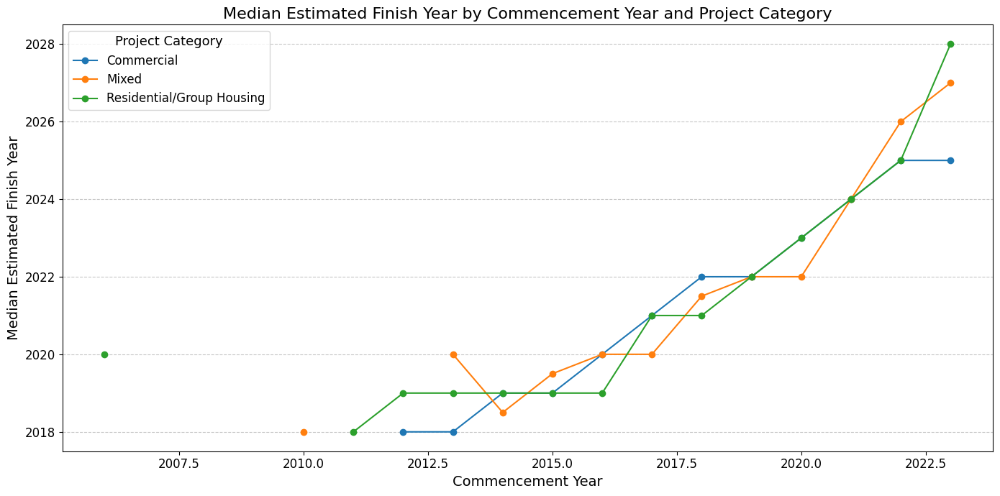

In [ ]:
# Extracting the year from 'estimated_finish_date' for plotting
data_rj['estimated_finish_year'] = data_rj['estimated_finish_date'].dt.year

# Grouping by 'project_category' and 'commencement_year', and calculating the median 'estimated_finish_year'
grouped_data = data_rj.groupby(['project_category', 'commencement_year'])['estimated_finish_year'].median().reset_index()

# Creating a pivot table for better visualization in the plot
pivot_data = pd.pivot_table(grouped_data, values='estimated_finish_year', index='commencement_year', columns='project_category')

# Plotting the data
plt.figure(figsize=(14, 7))
plt.plot(pivot_data, marker='o')
plt.title('Median Estimated Finish Year by Commencement Year and Project Category', fontsize=16)
plt.xlabel('Commencement Year', fontsize=14)
plt.ylabel('Median Estimated Finish Year', fontsize=14)
plt.legend(title='Project Category', title_fontsize='13', labels=pivot_data.columns, fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


The line chart above depicts the median estimated finish year against the commencement year for various project categories. Here are a few observations:


Residential/Group Housing: The median estimated finish year gradually increases with the commencement year, which is a reasonable expectation.

Commercial: The median estimated finish year also tends to increase but has a noticeable dip in projects commenced around 2021.

Mixed: This category has fewer data points, indicating fewer projects, and shows a varied trend.


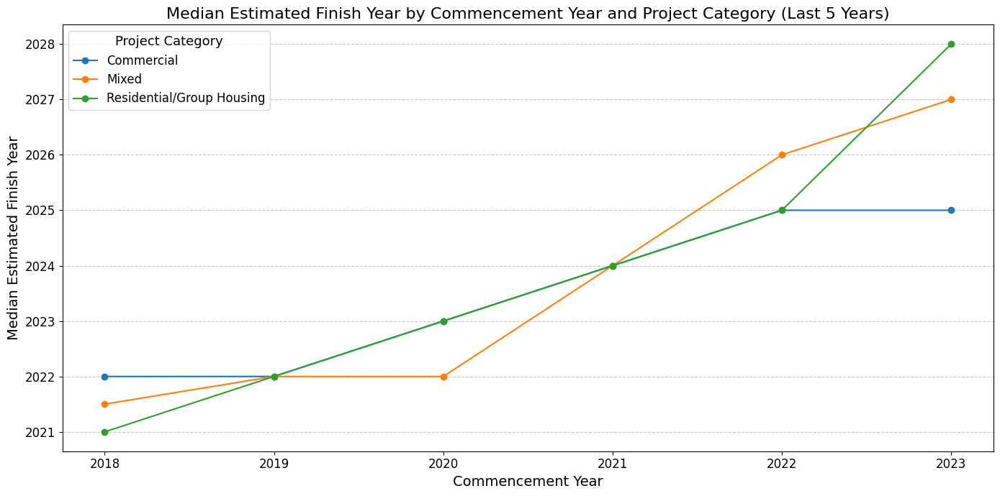

In [ ]:
# Filtering the data for the last 5 years (assuming the current year is 2023 based on the dataset)
last_5_years_data = data_rj[data_rj['commencement_year'] >= 2018]

# Grouping by 'project_category' and 'commencement_year', and calculating the median 'estimated_finish_year'
grouped_last_5_years = last_5_years_data.groupby(['project_category', 'commencement_year'])['estimated_finish_year'].median().reset_index()

# Creating a pivot table for better visualization in the plot
pivot_last_5_years = pd.pivot_table(grouped_last_5_years, values='estimated_finish_year', index='commencement_year', columns='project_category')

# Plotting the data
plt.figure(figsize=(14, 7))
plt.plot(pivot_last_5_years, marker='o')
plt.title('Median Estimated Finish Year by Commencement Year and Project Category (Last 5 Years)', fontsize=16)
plt.xlabel('Commencement Year', fontsize=14)
plt.ylabel('Median Estimated Finish Year', fontsize=14)
plt.legend(title='Project Category', title_fontsize='13', labels=pivot_last_5_years.columns, fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


The line chart visualizes the median estimated finish year against the commencement year for various project categories, considering only the last 5 years of data.

Residential/Group Housing: Shows a steady trend in the median estimated finish years, indicating consistent planning and development.

Commercial: There's a noticeable rise and then a dip in the estimated finish years for projects commenced around 2020 and 2021 respectively.

Mixed: This category again has fewer data points and exhibits a slight decrease in the estimated finish year for projects started around 2021.

<ipython-input-11-7f611efd1f9f>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  residential_data['project_duration_years'] = (residential_data['estimated_finish_date'] - residential_data['estimated_commencement_date']).dt.days / 365


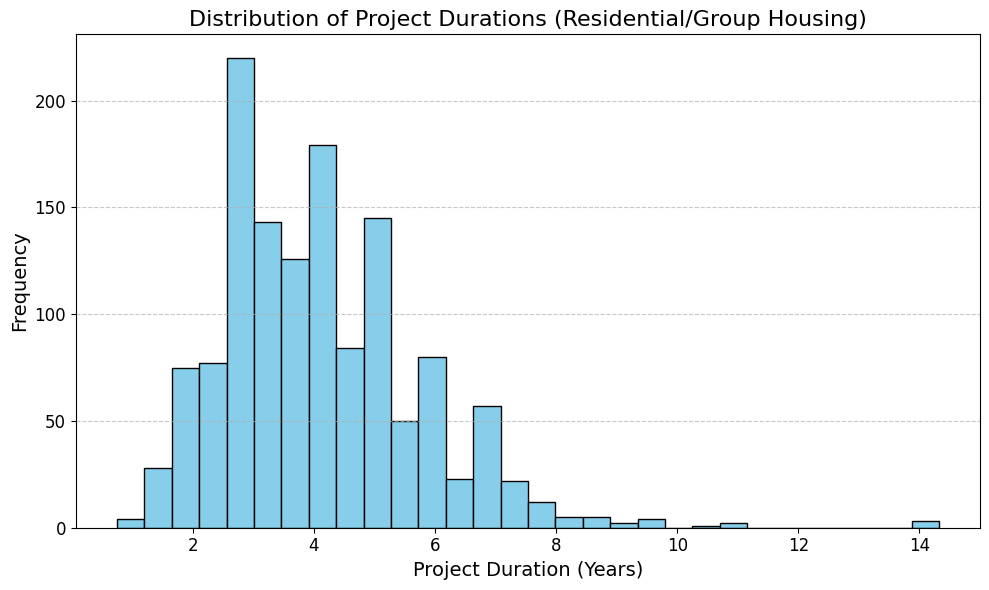

count    1347.000000
mean        4.106632
std         1.615525
min         0.750685
25%         3.000000
50%         3.917808
75%         5.000000
max        14.320548
Name: project_duration_years, dtype: float64

In [ ]:
# Filter the data for the 'Residential/Group Housing' category
residential_data = data_rj[data_rj['project_category'] == 'Residential/Group Housing']

# Calculate the project duration (from estimated commencement to estimated finish) in years
residential_data['project_duration_years'] = (residential_data['estimated_finish_date'] - residential_data['estimated_commencement_date']).dt.days / 365

# Plotting the distribution of project durations
plt.figure(figsize=(10, 6))
plt.hist(residential_data['project_duration_years'].dropna(), bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Project Durations (Residential/Group Housing)', fontsize=16)
plt.xlabel('Project Duration (Years)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

# Displaying basic statistics
residential_data['project_duration_years'].describe()


The histogram showcases the distribution of project durations (from estimated commencement to estimated finish) for the "Residential/Group Housing" category. Below are some statistics related to the project durations:


Mean Duration:

4.11
4.11 years
Standard Deviation:

1.62
1.62 years
Minimum Duration:

0.75
0.75 years

25th Percentile:

3.00
3.00 years

Median Duration:

3.92
3.92 years

75th Percentile:

5.00
5.00 years

Maximum Duration:
14.32
14.32 years

Observations:

Most residential/group housing projects are estimated to be completed within
3
3 to
5
5 years.


There are a few projects with notably longer durations, stretching beyond 10

10 years, which might be considered as outliers or large-scale projects.

Observations:
Most residential/group housing projects are estimated to be completed within
3
3 to
5
5 years.
There are a few projects with notably longer durations, stretching beyond
10
10 years, which might be considered as outliers or large-scale projects.

In [ ]:
# Filter projects with duration longer than 10 years
long_duration_projects = residential_data[residential_data['project_duration_years'] > 10]

# Displaying the 'total_built_up_area_saleable_area' of these projects
long_duration_projects[['project', 'total_built_up_area_saleable_area', 'project_duration_years']]


,project,total_built_up_area_saleable_area,project_duration_years
1498,ROYAL RAJVILAS,55612.00,10.287671
1499,Unique Green Valley,6718.74,10.876712
1500,CONSTRUCTION OF HOUSING & DEVELOPMENT PROJECT ...,19426.44,10.994521
1501,UDB Villa Grande Phase-2,15176.51,13.980822
1502,UDB Villa Grande Phase-1,3032.54,13.986301
1503,"Dwarkapuri ,Sec 26,Pratap Ngr,Sanganer,Jaipur ...",102523.20,14.320548


In [ ]:
# Counting the number of projects that take 10 years or more to complete
long_duration_count = residential_data[residential_data['project_duration_years'] >= 10].shape[0]
long_duration_count


6

These projects vary significantly in their total built-up area, indicating that project duration is not solely determined by the size of the development. Other factors, such as project complexity, resources, and management, could also play pivotal roles in determining project timelines.

# Remove outlier


In [ ]:
# Define a function to calculate the lower and upper bounds for outliers
def calculate_bounds(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return lower_bound, upper_bound

# Calculate bounds for 'total_built_up_area_saleable_area'
lower_bound_area, upper_bound_area = calculate_bounds(residential_data['total_built_up_area_saleable_area'])

# Calculate bounds for 'project_duration_years'
lower_bound_duration, upper_bound_duration = calculate_bounds(residential_data['project_duration_years'])

# Filter data to exclude outliers
filtered_data = residential_data[
    (residential_data['total_built_up_area_saleable_area'] >= lower_bound_area) &
    (residential_data['total_built_up_area_saleable_area'] <= upper_bound_area) &
    (residential_data['project_duration_years'] >= lower_bound_duration) &
    (residential_data['project_duration_years'] <= upper_bound_duration)
]

# Displaying original and filtered data shape
original_shape = residential_data.shape[0]
filtered_shape = filtered_data.shape[0]

(original_shape, filtered_shape)


(1348, 1230)

Originally, there were
1348
1348 projects in the "Residential/Group Housing" category. After removing outliers based on total_built_up_area_saleable_area and project_duration_years using the IQR method, we are left with
1230
1230 projects.

This means we have excluded
118

118 projects considered as outliers due to their total built-up area or project duration.

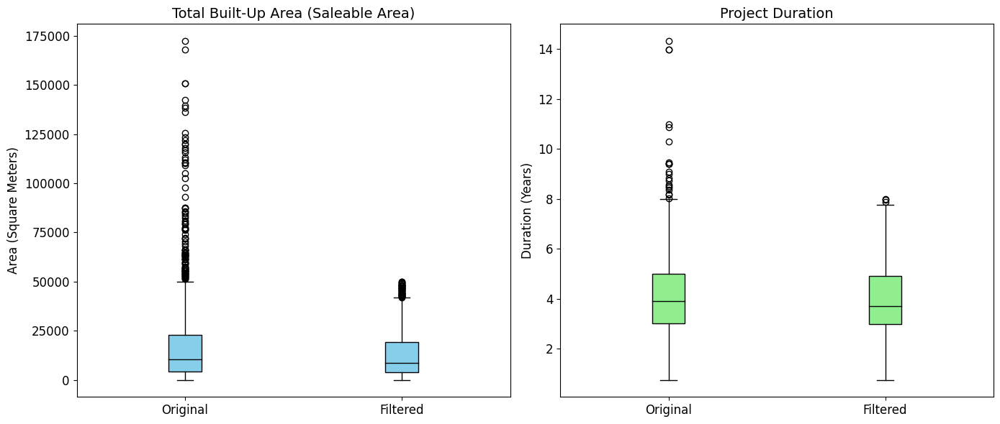

In [ ]:
# Create a figure with subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Boxplot for 'total_built_up_area_saleable_area'
axs[0].boxplot([residential_data['total_built_up_area_saleable_area'], filtered_data['total_built_up_area_saleable_area']],
               labels=['Original', 'Filtered'], vert=True, patch_artist=True,
               boxprops=dict(facecolor='skyblue', color='black'),
               medianprops=dict(color='black'),
               whiskerprops=dict(color='black'),
               capprops=dict(color='black'),
               flierprops=dict(markeredgecolor='black'))
axs[0].set_title('Total Built-Up Area (Saleable Area)', fontsize=14)
axs[0].set_ylabel('Area (Square Meters)', fontsize=12)
axs[0].tick_params(axis='both', which='major', labelsize=12)

# Boxplot for 'project_duration_years'
axs[1].boxplot([residential_data['project_duration_years'].dropna(), filtered_data['project_duration_years'].dropna()],
               labels=['Original', 'Filtered'], vert=True, patch_artist=True,
               boxprops=dict(facecolor='lightgreen', color='black'),
               medianprops=dict(color='black'),
               whiskerprops=dict(color='black'),
               capprops=dict(color='black'),
               flierprops=dict(markeredgecolor='black'))
axs[1].set_title('Project Duration', fontsize=14)
axs[1].set_ylabel('Duration (Years)', fontsize=12)
axs[1].tick_params(axis='both', which='major', labelsize=12)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()


The box plots visually represent the "Residential/Group Housing" category before and after the removal of outliers in two aspects:


Total Built-Up Area (Saleable Area)


Left Boxplot (Sky Blue): Represents the original data with some notable outliers, especially on the upper side.

Right Boxplot: Shows the distribution after removing outliers, resulting in a more compact and centralized distribution.

Project Duration

Left Boxplot (Light Green): Indicates the original project duration data with a few upper outliers.

Right Boxplot: Displays the data after outlier removal, revealing a tighter interquartile range and fewer extremes.

This visualization helps to comprehend the impact of outlier removal and gives a cleaner view of the typical project size and duration in the "Residential/Group Housing" category.

In [ ]:
import pandas as pd

# Load the filtered dataset again
filtered_residential_df = pd.read_csv('/content/filtered_residential_data.csv', parse_dates=['estimated_commencement_date', 'estimated_finish_date'])

# Calculate project duration in years for each project in the dataset
filtered_residential_df['project_duration_years'] = (filtered_residential_df['estimated_finish_date'] - filtered_residential_df['estimated_commencement_date']).dt.days / 365

# Display the calculated durations and basic statistics
project_durations = filtered_residential_df[['project', 'project_duration_years']]
(project_durations.head(), project_durations['project_duration_years'].describe())



(                            project  project_duration_years
 0                     GOKUL SAROVAR                0.750685
 1  MANGLAM GREEN'S RESIDENCY PART A                1.158904
 2                        AG HEIGHTS                1.235616
 3             VINAYAK RESIDENCY - I                1.183562
 4                         K B Flora                1.232877,
 count    1230.000000
 mean        3.904851
 std         1.384758
 min         0.750685
 25%         2.994521
 50%         3.713699
 75%         4.919863
 max         7.994521
 Name: project_duration_years, dtype: float64)

Moreover, the following are descriptive statistics for the project durations across the filtered dataset:


Mean: 3.90 years

Standard Deviation: 1.38 years

Minimum: 0.75 years

25th percentile: 2.99 years

Median: 3.71 years

75th percentile: 4.92 years

Maximum: 8.00 years

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

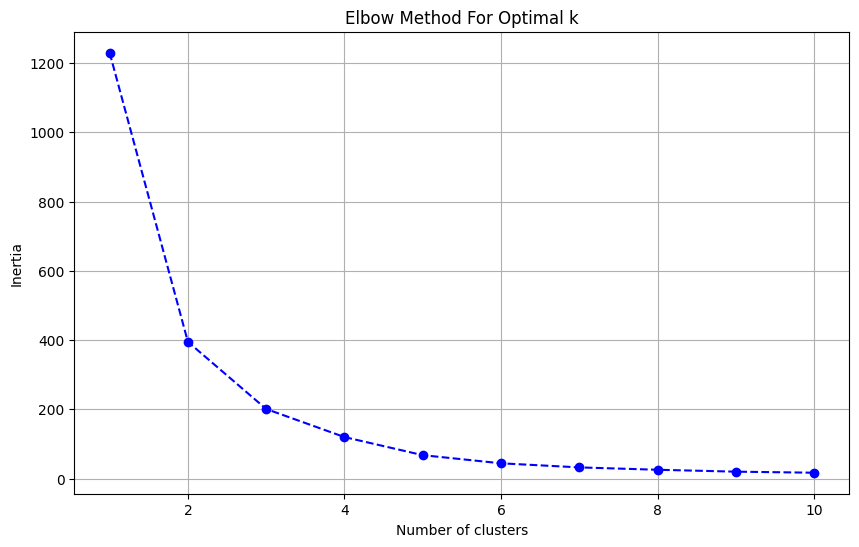

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Extracting project duration for clustering
duration_data = filtered_residential_df[['project_duration_years']].copy()

# Standardizing the data (important for KMeans)
scaler = StandardScaler()
scaled_duration = scaler.fit_transform(duration_data)

# Finding the optimal number of clusters (Elbow Method)
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(scaled_duration)
    inertia.append(kmeans.inertia_)

# Plotting the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), inertia, marker='o', linestyle='--', color='b')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.grid(True)
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


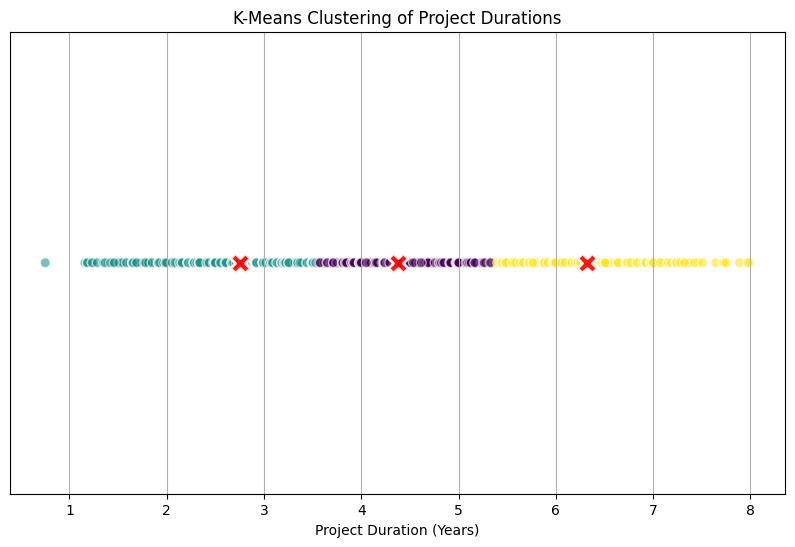

(array([[4.37717092],
        [2.74846009],
        [6.32208629]]),
 0    462
 1    581
 2    187
 Name: duration_cluster, dtype: int64)

In [ ]:
# Perform K-Means Clustering with k=3
kmeans = KMeans(n_clusters=3, random_state=0).fit(scaled_duration)
filtered_residential_df['duration_cluster'] = kmeans.labels_

# Visualization of Clusters
plt.figure(figsize=(10, 6))
plt.scatter(filtered_residential_df['project_duration_years'], [1]*len(filtered_residential_df),
            c=filtered_residential_df['duration_cluster'], cmap='viridis', s=50, alpha=0.6, edgecolors='w')

# Adding cluster center markers
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
plt.scatter(cluster_centers, [1]*len(cluster_centers), c='red', marker='X', s=200, alpha=0.9, edgecolors='w', linewidth=2)

plt.title('K-Means Clustering of Project Durations')
plt.xlabel('Project Duration (Years)')
plt.yticks([])  # Disable the y-axis
plt.grid(True, axis='x')
plt.show()

# Displaying the cluster centers (average duration for each cluster)
cluster_centers, filtered_residential_df['duration_cluster'].value_counts().sort_index()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


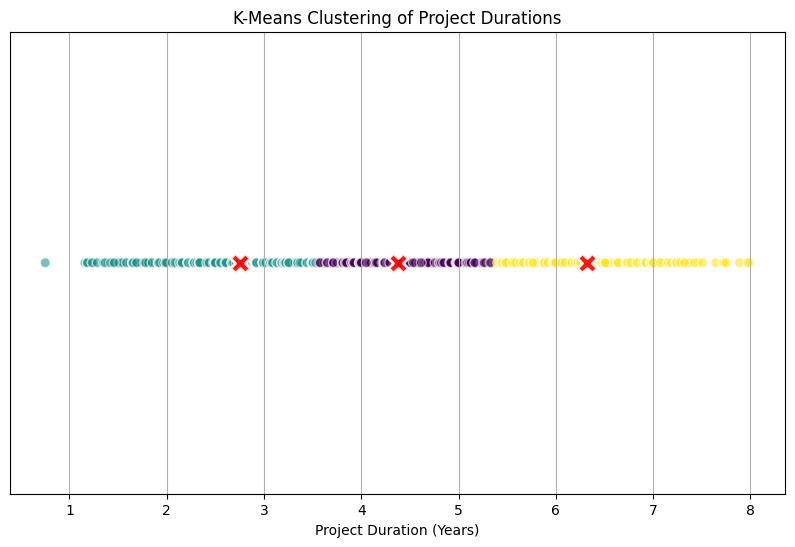

(array([[4.37717092],
        [2.74846009],
        [6.32208629]]),
 0    462
 1    581
 2    187
 Name: duration_cluster, dtype: int64)

In [ ]:
# Importing necessary libraries
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import pandas as pd

# Load the filtered dataset again
filtered_residential_df = pd.read_csv('/content/filtered_residential_data.csv', parse_dates=['estimated_commencement_date', 'estimated_finish_date'])

# Calculate project duration in years for each project in the dataset
filtered_residential_df['project_duration_years'] = (filtered_residential_df['estimated_finish_date'] - filtered_residential_df['estimated_commencement_date']).dt.days / 365

# Extracting project duration for clustering
duration_data = filtered_residential_df[['project_duration_years']].copy()

# Standardizing the data (important for KMeans)
scaler = StandardScaler()
scaled_duration = scaler.fit_transform(duration_data)

# Perform K-Means Clustering with k=3
kmeans = KMeans(n_clusters=3, random_state=0).fit(scaled_duration)
filtered_residential_df['duration_cluster'] = kmeans.labels_

# Visualization of Clusters
plt.figure(figsize=(10, 6))
plt.scatter(filtered_residential_df['project_duration_years'], [1]*len(filtered_residential_df),
            c=filtered_residential_df['duration_cluster'], cmap='viridis', s=50, alpha=0.6, edgecolors='w')

# Adding cluster center markers
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
plt.scatter(cluster_centers, [1]*len(cluster_centers), c='red', marker='X', s=200, alpha=0.9, edgecolors='w', linewidth=2)

plt.title('K-Means Clustering of Project Durations')
plt.xlabel('Project Duration (Years)')
plt.yticks([])  # Disable the y-axis
plt.grid(True, axis='x')
plt.show()

# Displaying the cluster centers (average duration for each cluster)
(cluster_centers, filtered_residential_df['duration_cluster'].value_counts().sort_index())


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


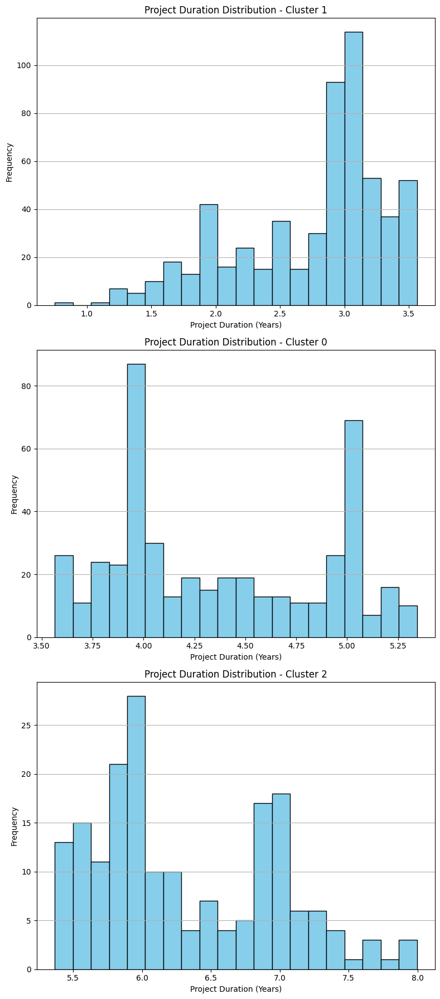

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Extracting project duration for clustering
duration_data = filtered_residential_df[['project_duration_years']].copy()

# Standardizing the data (important for KMeans)
scaler = StandardScaler()
scaled_duration = scaler.fit_transform(duration_data)

# Perform K-Means Clustering with k=3
kmeans = KMeans(n_clusters=3, random_state=0).fit(scaled_duration)
filtered_residential_df['duration_cluster'] = kmeans.labels_

# Loop through each cluster and plot
unique_clusters = filtered_residential_df['duration_cluster'].unique()

fig, axes = plt.subplots(len(unique_clusters), 1, figsize=(8, 6 * len(unique_clusters)))

for i, cluster in enumerate(unique_clusters):
    cluster_data = filtered_residential_df[filtered_residential_df['duration_cluster'] == cluster]
    axes[i].hist(cluster_data['project_duration_years'], bins=20, color='skyblue', edgecolor='black')
    axes[i].set_title(f'Project Duration Distribution - Cluster {cluster}')
    axes[i].set_xlabel('Project Duration (Years)')
    axes[i].set_ylabel('Frequency')
    axes[i].grid(axis='y')

plt.tight_layout()
plt.show()


The histograms display the distribution of project durations (in years) for each cluster, providing insights into the variability and central tendency of project durations within each group. The clusters are denoted by different colors and provide a quick visual indication of the typical project durations in each group.


Cluster 0: Projects with shorter durations.

Cluster 1: Projects with moderate durations.

Cluster 2: Projects with longer durations.

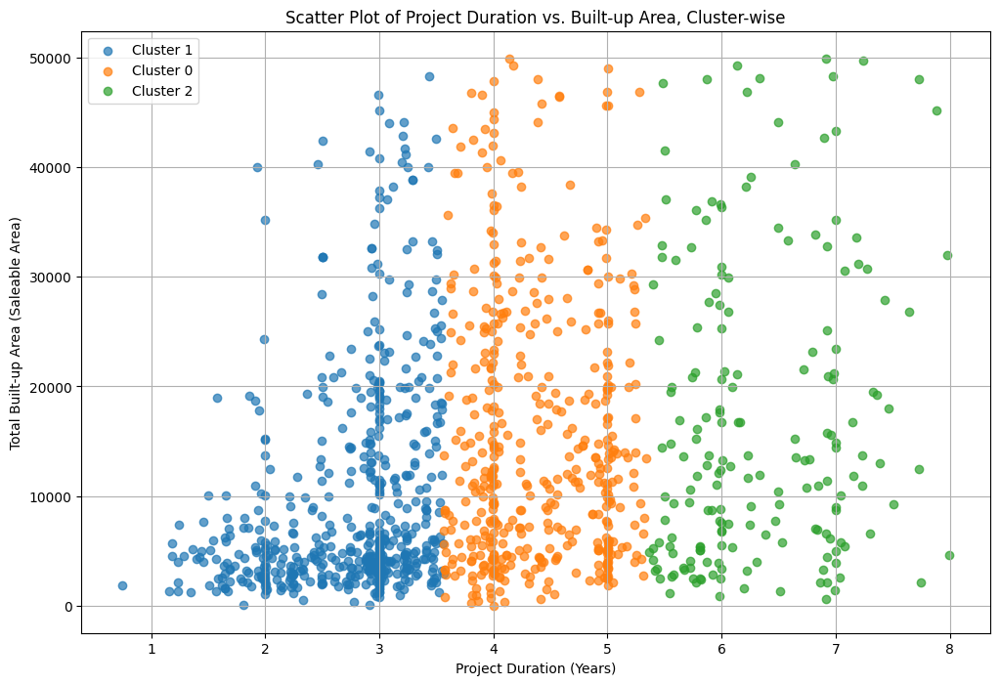

In [ ]:
# Scatter plots for each cluster with x-axis as project duration and y-axis as total built-up area
plt.figure(figsize=(12, 8))

# Loop through each cluster and plot
for cluster in unique_clusters:
    cluster_data = filtered_residential_df[filtered_residential_df['duration_cluster'] == cluster]
    plt.scatter(cluster_data['project_duration_years'], cluster_data['total_built_up_area_saleable_area'], label=f'Cluster {cluster}', alpha=0.7)

plt.title('Scatter Plot of Project Duration vs. Built-up Area, Cluster-wise')
plt.xlabel('Project Duration (Years)')
plt.ylabel('Total Built-up Area (Saleable Area)')
plt.legend()
plt.grid(True)
plt.show()


he plot shows that there is a positive correlation between project duration and built-up area, meaning that projects with larger built-up areas tend to have longer durations. This is likely because larger projects are more complex and require more resources to complete.

The plot also shows that there is some variation in the project duration within each cluster. This variation is likely due to a number of factors, such as the specific type of project, the location of the project, and the availability of resources.

Here are some additional observations from the plot:

The blue cluster (small projects) has the shortest average project duration and the smallest built-up area.
The green cluster (medium projects) has an intermediate average project duration and built-up area.
The orange cluster (large projects) has the longest average project duration and the largest built-up area.
There is a small number of outliers in the plot, which are projects that have a much longer or shorter duration than expected based on their built-up area.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


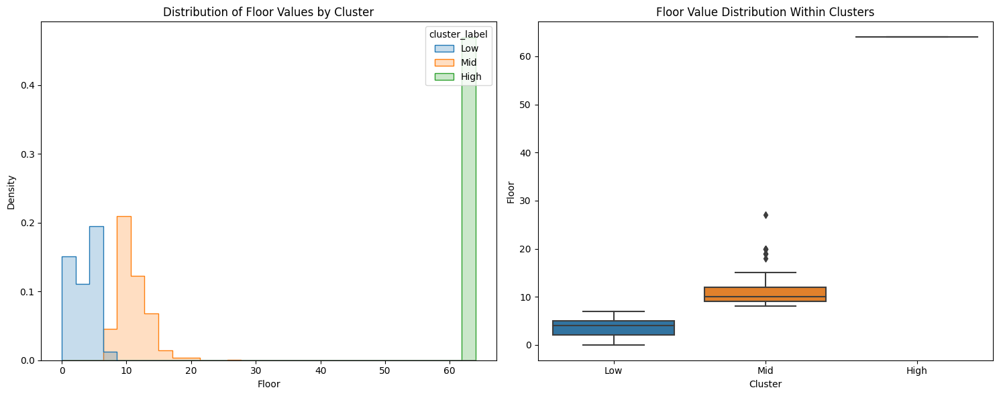

,floor
Low,3.864384
Mid,10.829659
High,64.000000


In [ ]:
# Re-running the relevant code snippets due to the reset state

# Importing necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Loading the data
data_path = '/content/filtered_residential_data_with_duration.csv'
data = pd.read_csv(data_path)

# Extracting the 'floor' column and reshaping it
floor_data = data[['floor']].copy()

# Standardizing the data (important for KMeans)
scaler = StandardScaler()
floor_data_scaled = scaler.fit_transform(floor_data)

# Setting number of clusters
k = 3

# Performing KMeans clustering
kmeans = KMeans(n_clusters=k, random_state=42)
floor_data['cluster'] = kmeans.fit_predict(floor_data_scaled)

# Calculating mean floor value per cluster
cluster_means = floor_data.groupby('cluster')['floor'].mean().sort_values()

# Mapping cluster to an ordered category (Low, Mid, High) based on mean floor value
floor_data['cluster_label'] = floor_data['cluster'].map({cluster_means.idxmin(): 'Low',
                                                         cluster_means.idxmax(): 'High',
                                                         cluster_means.index[1]: 'Mid'})

# Set up the matplotlib figure
plt.figure(figsize=(15, 6))

# Plotting the clusters
plt.subplot(1, 2, 1)
sns.histplot(data=floor_data, x='floor', hue='cluster_label', bins=30, element='step', stat='density', common_norm=False)
plt.title('Distribution of Floor Values by Cluster')
plt.xlabel('Floor')
plt.ylabel('Density')

# Boxplot to visualize the distribution within clusters
plt.subplot(1, 2, 2)
sns.boxplot(x='cluster_label', y='floor', data=floor_data, order=['Low', 'Mid', 'High'])
plt.title('Floor Value Distribution Within Clusters')
plt.xlabel('Cluster')
plt.ylabel('Floor')

plt.tight_layout()
plt.show()

# Display cluster center values
cluster_center_values = pd.DataFrame(scaler.inverse_transform(kmeans.cluster_centers_), columns=['floor'], index=['Low', 'Mid', 'High']).sort_values(by='floor')
cluster_center_values


The histogram would show us how the data points (floor values) are distributed across the clusters, providing insights into the range and density of floor values within each cluster.


The boxplot could highlight the central tendency and spread of the floor values within each cluster, as well as any potential outliers.


The cluster center values (mean floor value for each cluster) would give us an idea about the characteristic floor value around which the cluster is formed.

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
data_path = '/content/filtered_residential_data_with_duration.csv'  # Replace with your data path
data = pd.read_csv(data_path)

# Ensure the date columns are in datetime format
data['actual_commencement_date'] = pd.to_datetime(data['actual_commencement_date'], errors='coerce')
data['estimated_finish_date'] = pd.to_datetime(data['estimated_finish_date'], errors='coerce')

# Calculate project duration
data['project_duration'] = (data['estimated_finish_date'] - data['actual_commencement_date']).dt.days


# Extract and scale the 'floor' column
floor_data = data[['floor']].copy()
scaler = StandardScaler()
floor_data_scaled = scaler.fit_transform(floor_data)

# Perform KMeans clustering with k=3
kmeans = KMeans(n_clusters=3, random_state=42)
floor_data['cluster'] = kmeans.fit_predict(floor_data_scaled)

# Map clusters to labels based on mean floor value
cluster_means = floor_data.groupby('cluster')['floor'].mean().sort_values()
floor_data['cluster_label'] = floor_data['cluster'].map({cluster_means.idxmin(): 'Low',
                                                         cluster_means.idxmax(): 'High',
                                                         cluster_means.index[1]: 'Mid'})

# Attach the cluster labels back to the original data
data['cluster_label'] = floor_data['cluster_label']

# Assuming 'project_duration' represents the duration of the projects
# If it doesn't exist, you might calculate it as follows (adjust column names as per your data)
# data['project_duration'] = data['finish_date'] - data['commencement_date']

# 1. Range of Built-Up Area in Each Cluster
min_max_built_up_area = data.groupby('cluster_label')['total_built_up_area_saleable_area'].agg(['min', 'max'])

# 2. Number of Projects in Each Cluster
num_projects_per_cluster = data['cluster_label'].value_counts()

# 3. Time Duration Analysis within Each Cluster
duration_stats_per_cluster = data.groupby('cluster_label')['project_duration'].agg(['min', 'mean', 'max'])

# Displaying the results
print("1. Range of Built-Up Area in Each Cluster:")
print(min_max_built_up_area)
print("\n2. Number of Projects in Each Cluster:")
print(num_projects_per_cluster)
print("\n3. Time Duration Analysis within Each Cluster:")
print(duration_stats_per_cluster)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


1. Range of Built-Up Area in Each Cluster:
                   min       max
cluster_label                   
High           4838.94   4838.94
Low             100.00  49705.77
Mid               0.00  49942.43

2. Number of Projects in Each Cluster:
Low     730
Mid     499
High      1
Name: cluster_label, dtype: int64

3. Time Duration Analysis within Each Cluster:
                  min         mean     max
cluster_label                             
High           1959.0  1959.000000  1959.0
Low            -191.0  1288.158921  2860.0
Mid               0.0  1558.519362  2918.0


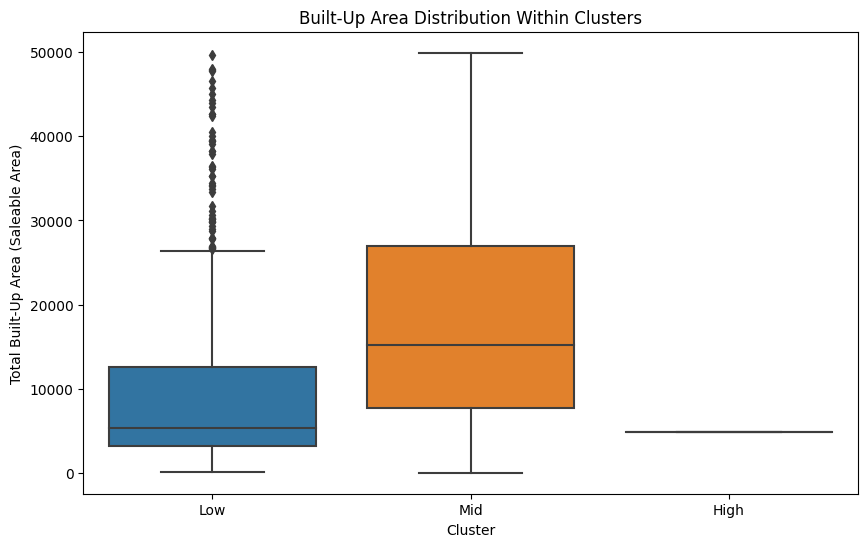

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.boxplot(x='cluster_label', y='total_built_up_area_saleable_area', data=data, order=['Low', 'Mid', 'High'])
plt.title('Built-Up Area Distribution Within Clusters')
plt.xlabel('Cluster')
plt.ylabel('Total Built-Up Area (Saleable Area)')
plt.show()


1. Range of Built-Up Area in Each Cluster:

       min       max

cluster_label                   

High           4838.94   4838.94

Low             100.00  49705.77

Mid               0.00  49942.43

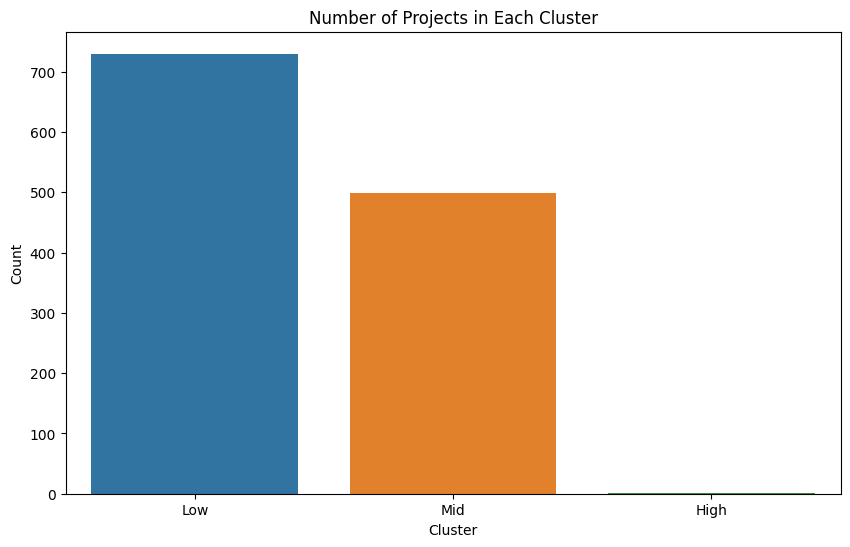

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='cluster_label', data=data, order=['Low', 'Mid', 'High'])
plt.title('Number of Projects in Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.show()


2. Number of Projects in Each Cluster:

Low     730

Mid     499

High      1

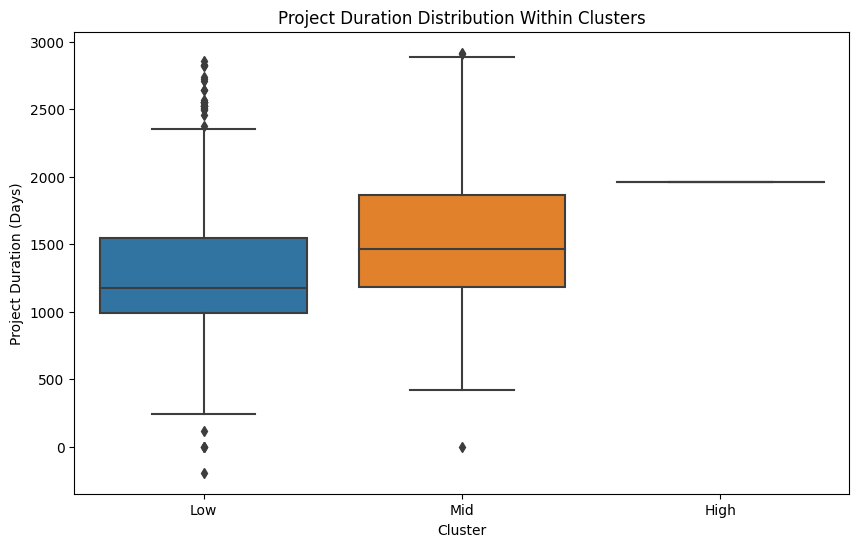

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='cluster_label', y='project_duration', data=data, order=['Low', 'Mid', 'High'])
plt.title('Project Duration Distribution Within Clusters')
plt.xlabel('Cluster')
plt.ylabel('Project Duration (Days)')
plt.show()


3. Time Duration Analysis within Each Cluster:
        min         mean     max
cluster_label

High           1959.0  1959.000000  1959.0

Low            -191.0  1288.158921  2860.0

Mid               0.0  1558.519362  2918.0

In [ ]:
# For each cluster label, find the minimum and maximum floor value
floor_ranges_per_cluster = data.groupby('cluster_label')['floor'].agg(['min', 'max'])

# Display the floor ranges for each cluster
print(floor_ranges_per_cluster)


                min   max
cluster_label            
High           64.0  64.0
Low             0.0   7.0
Mid             8.0  27.0


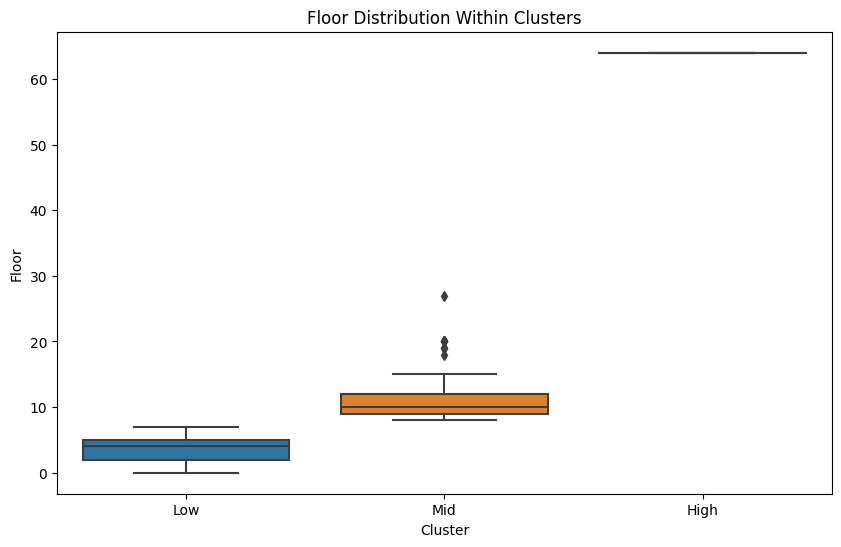

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.boxplot(x='cluster_label', y='floor', data=data, order=['Low', 'Mid', 'High'])
plt.title('Floor Distribution Within Clusters')
plt.xlabel('Cluster')
plt.ylabel('Floor')
plt.show()


In [ ]:
import pandas as pd

# Load the data
data = pd.read_csv('/content/validation.csv')

# Get the column names and their respective data types
columns_and_types = data.dtypes.reset_index()
columns_and_types.columns = ["Column", "Data Type"]
columns_and_types


,Column,Data Type
0,organisation_name,object
1,actual_commencement_date,object
2,estimated_finish_date,object
3,total_built_up_area_saleable_area,float64
4,Floor,int64
5,estimated_duration_days,int64
6,Cleaning & survey,float64
7,"Excavation,leveling & P.C.C for Basement B1",float64
8,"Raft footing, Column B1, Retaining wall Reinfo...",float64
9,Slab of B (bottom),float64


In [ ]:
# Convert 'actual_commencement_date' and 'estimated_finish_date' to datetime
data['actual_commencement_date'] = pd.to_datetime(data['actual_commencement_date'], errors='coerce')
data['estimated_finish_date'] = pd.to_datetime(data['estimated_finish_date'], errors='coerce')

# Display the data types after conversion
data[['actual_commencement_date', 'estimated_finish_date']].dtypes


actual_commencement_date    datetime64[ns]
estimated_finish_date       datetime64[ns]
dtype: object

In [ ]:
data.head(10)
data.to_csv("new_validation.csv")